## How to use the t-SNE algorithm on APOGEE globular cluster data. 
##### Steffani Grondin (September 23, 2022)

In [ ]:
%pip install sklearn
%pip install shapely

In [ ]:
%pip install shapely

In [52]:
%pip install tqdm

## Notes for this program

My parameter list is different from Steffani's. My param list is shown below:\\\\
param_list = ['# APOGEE_ID_', 'GAIAEDR3_SOURCE_ID', 'GAIAEDR3_PARALLAX', 'GAIAEDR3_PARALLAX_ERROR', 'RA', 'DEC', 'GAIAEDR3_PMRA', 'GAIAEDR3_PMRA_ERROR', 'GAIAEDR3_PMDEC', 'GAIAEDR3_PMDEC_ERROR', 'GAIAEDR3_DR2_RADIAL_VELOCITY', 'GAIAEDR3_DR2_RADIAL_VELOCITY_ERROR', 'SNR', 'FE_H', 'FE_H_ERR', 'C_FE', 'C_FE_ERR', 'CI_FE', 'CI_FE_ERR', 'N_FE', 'N_FE_ERR', 'O_FE', 'O_FE_ERR', 'MG_FE', 'MG_FE_ERR', 'AL_FE', 'AL_FE_ERR', 'SI_FE', 'SI_FE_ERR', 'P_FE', 'P_FE_ERR', 'S_FE', 'S_FE_ERR', 'K_FE', 'K_FE_ERR', 'CA_FE', 'CA_FE_ERR', 'TI_FE', 'TI_FE_ERR', 'TIII_FE', 'TIII_FE_ERR', 'V_FE', 'V_FE_ERR', 'CR_FE', 'CR_FE_ERR', 'MN_FE', 'MN_FE_ERR', 'CO_FE', 'CO_FE_ERR', 'NI_FE', 'NI_FE_ERR']\\\\

So basically the RA index is 4, DEC index is 5, RV index is 10, and the first chemical abundance is at 13. The chemical abundances follow Steffani's form (e.g. abundance1, abundance1_error, abundance2, abundance2_error, etc.). What I did was make the standardizing step for both tSNE and UMAP take in the index of the first chemical abundance and from there it automatically adds 2 for each chem abundance going up.\\\\

Basically if you use my param_list it'll work. The param_list variable is just a list of strings of the index titles, I have a function somewhere that grabs the data for those indices.\\\\

For each GC, we just need the ra, dec, rhm_deg (rhm depends on dist I think).\\
There are global parameters for all GCs as well, so the parameter list, fov, and chemical abundance starting index.\\\\

LMK if shit dont work and there's probably something I forgot to explain.

#### STEP 0: Import the necessary packages/algorithms.

In [1]:
# General analysis/plotting packages:
import matplotlib.pyplot as plt
import numpy as np
import math
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rc
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
from collections import Counter

# Specific t-SNE/visualization packages:
from sklearn.manifold import TSNE
from shapely.geometry import Point, Polygon

# UMAP shit
# Import UMAP
import umap.umap_ as umap

# Try using SKLEARN's StandardScaler to standardize the data
from sklearn.preprocessing import StandardScaler

# I/O
import sys

# OS
import os

# dbscan
from sklearn.cluster import DBSCAN

# tqdm
from tqdm.notebook import tqdm

### Step 1: Load in the clusters

#### Load in selected star cluster
Input RA and DEC and the program will load in all the stars within a $10^o$ by $10^o$ FOV.

In [2]:
'''Read in APOGEE CSV file'''

apogee_filt = pd.read_csv('data/APOGEEDR17_GAIAEDR3_filter.csv', delimiter=',')
apogee_nofilt = pd.read_csv('data/APOGEEDR17_GAIAEDR3_noflagfilter.csv', delimiter=',')
GC_db = pd.read_csv('data/nice_GCs.csv', delimiter=',')

In [160]:
### Finding stars within a set FOV of the GC centre
def find_cluster_stars(ra, dec, fov, df, name, rhm_deg, rt_deg):
    
    stars = []
    for count, i in enumerate(df['RA'].values):
        if i >= ra - fov and i <= ra + fov and df['DEC'].values[count] >= dec - fov and df['DEC'].values[count] <= dec + fov:
            stars.append(df.loc[count])
            
    print(len(stars), 'stars in a 10x10 fov of the GC')
    
    if len(stars) != 0:
        # create a folder with name of GC only if there are stars in the field
        try: 
            os.makedirs('GCs_nice/' + name)
        except OSError as error:
            print('Directory ' + name+ ' already exists')

    ra_arr = np.empty(len(stars), dtype=float)
    dec_arr = np.empty(len(stars), dtype=float)
    for count, i in enumerate(stars):
        ra_arr[count] = i['RA']
        dec_arr[count] = i['DEC']
    
    rhm_circ = plt.Circle((ra, dec), rhm_deg, color='r', fill=False, label='rhm')
    rhm_rt_circ = plt.Circle((ra, dec), (rhm_deg + rt_deg)/2, color='g', fill=False, label='1/2 rhm, rt')
    rt_circ = plt.Circle((ra, dec), rt_deg, color='b', fill=False, label='rt')
    
    #plt.figure(figsize=(10,10))
    fig, ax = plt.subplots(1, figsize=(20,20))
    '''fig = plt.gcf()
    ax = plt.gca()'''
    plt.plot(ra_arr, dec_arr, 'ok', linestyle='none', markersize=1, label='Stars')
    plt.plot(ra, dec, 'or', linestyle='none', markersize=5, label='GC centre')
    ax.add_patch(rhm_circ)
    ax.add_patch(rhm_rt_circ)
    ax.add_patch(rt_circ)
    plt.xlabel('RA')
    plt.ylabel('DEC')
    plt.title(name)
    plt.xlim(ra - fov - 1, ra + fov + 1)
    plt.ylim(dec - fov - 1, dec + fov + 1)
    try:
        plt.savefig('GCs_nice/'+name+'/radec.png')
    except:
        print('No stars yo')
    #plt.show()
    ax.legend(loc='best')
    plt.close('all')
    return stars
            

#### Separating list of stars into lists by parameter

In [4]:
def split_star_list(stars, parameters):
    param_dict = {}
    for i in parameters:
        if str(i) == '# APOGEE_ID_':
            param_dict[str(i)] = np.empty(len(stars), dtype=object)
        else:
            param_dict[str(i)] = np.empty(len(stars))
    for count,i in enumerate(stars):
        for j in parameters:
            param_dict[str(j)][count] = i[str(j)]
            
    return param_dict
        

#### Separating the dictionary values into a columns list

In [5]:
def split_cols(GC_param, parameters):
    cols = []
    for i in range(len(GC_param)):
        cols.append(GC_param[str(parameters[i])])
    
    return cols

#### Master GC load function

In [6]:
def master_load(ra, dec, fov, dataset, params, name, rhm_deg, rt_deg):
    stars_found = find_cluster_stars(ra, dec, fov, dataset, name, rhm_deg, rt_deg)
    GC_dict = split_star_list(stars_found, params)
    GC_cols = split_cols(GC_dict, param_list)
    
    return [GC_dict, GC_cols]
    

### Step 2: Filter the data

#### Filter 1 for data: Removing all stars without PM

In [7]:
def pm_filter(GC_dict, GC_cols):
    ### Filter 1: Remove stars that do not have proper motion values. ###
    pm_filter_nan = np.isnan(GC_dict['GAIAEDR3_PMRA'])
    pm_filter = np.where(pm_filter_nan==False)
    data_pmfilter = []
    for i in GC_cols:
        x = np.array(i)[pm_filter]
        data_pmfilter.append(x)
    #print("There are {} stars in our sample after the proper motion filtering.".format(len(data_pmfilter[0])))
    
    return data_pmfilter

#### Filter 2 for data: Removing all stars that do not have chemical abundances

In [8]:
def chem_filter(data_pmfilter, init_abundance_index):
    ### Filter 2: Remove stars that do not have data for all 19 abundances. ###
    abundance_filter = np.where((data_pmfilter[init_abundance_index] > -9999) & (data_pmfilter[init_abundance_index + 2] > -9999) & (data_pmfilter[init_abundance_index + 4]  > -9999)
                                & (data_pmfilter[init_abundance_index + 6]  > -9999) & (data_pmfilter[ init_abundance_index + 8]  > -9999) & (data_pmfilter[init_abundance_index + 10]  > -9999)
                                & (data_pmfilter[init_abundance_index + 12]  > -9999) & (data_pmfilter[init_abundance_index + 14]  > -9999) & (data_pmfilter[init_abundance_index + 16]  > -9999)
                                & (data_pmfilter[init_abundance_index + 18]  > -9999) & (data_pmfilter[init_abundance_index + 20]  > -9999) & (data_pmfilter[init_abundance_index + 22]  > -9999)
                                & (data_pmfilter[init_abundance_index + 24]  > -9999) & (data_pmfilter[init_abundance_index + 26]  > -9999) & (data_pmfilter[init_abundance_index + 28]  > -9999)
                                & (data_pmfilter[init_abundance_index + 30]  > -9999) & (data_pmfilter[init_abundance_index + 32]  > -9999) & (data_pmfilter[init_abundance_index + 34]  > -9999)
                                & (data_pmfilter[init_abundance_index + 36]  > -9999))

    data_abundancefilter = []
    for i in data_pmfilter:
        y = np.array(i)[abundance_filter]
        data_abundancefilter.append(y)
    #print("There are {} stars in our sample after the abundance filtering.".format(len(data_abundancefilter[0])))
    
    return data_abundancefilter

#### Filter 3 for data: Removing all duplicate spectra

In [9]:
# changed all indices of 0 to 4 (RA) and 23 to 12 (SNR)
def dup_filter(data_abundancefilter):
    d =  Counter(data_abundancefilter[4])
    #print(d)
    duplicates = [k for k, v in d.items() if v > 1]
    a_list = np.array(range(0, len(duplicates)))
    max_SNR_array = []

    for i in a_list:
        indices = np.where(data_abundancefilter[4] == duplicates[i])
        snr_val = data_abundancefilter[12][indices]
        maximum = max(snr_val)
        # 4 is RA, 12 is SNR
        index_maximum = np.where((data_abundancefilter[4] == duplicates[i]) & (data_abundancefilter[12] == maximum))
        #print(index_maximum[4])
        index_maximum = int(index_maximum[4])
        max_SNR_array.append(index_maximum)

    idx_sort = np.argsort(data_abundancefilter[4])
    sorted_ra_array = data_abundancefilter[4][idx_sort]
    vals, idx_start, count = np.unique(sorted_ra_array, return_counts=True, return_index=True)
    res = np.split(idx_sort, idx_start[1:])
    vals = vals[count == 1]
    listtest =  np.array(range(0, len(vals)))

    unique_array = []
    for i in listtest:
        unique_val = np.where(vals[i] == data_abundancefilter[4])
        unique_val = int(unique_val[0])
        unique_array.append(unique_val)

    #print("There are {} stars that do not have duplicate spectra.".format(len(unique_array)))
    #print("There are {} stars that have multiple spectra, in which we select highest SNR.".format(len(max_SNR_array)))
    
    if len(max_SNR_array) != 0:
        duplicates_filter = np.concatenate((unique_array, max_SNR_array))
        sortedarray = np.sort(duplicates_filter)

        data_duplicatesfilter = []
        for i in data_abundancefilter:
            z = np.array(i)[duplicates_filter]
            data_duplicatesfilter.append(z)

        #print("There are {} stars in our sample after removing sources with duplicate spectra.".format(len(data_duplicatesfilter[0])))
    
    else:
        #print('There were no duplicate spectra.')
        data_duplicatesfilter = data_abundancefilter
    
    return data_duplicatesfilter

#### Filter 4 for data: Removing all low SNR

In [10]:
def SNR_filter(data_duplicatesfilter):
    SNR_filter = np.where(data_duplicatesfilter[12] > 50)
    data_snrfilter = []
    for i in data_duplicatesfilter:
        a = np.array(i)[SNR_filter]
        data_snrfilter.append(a)

    #print("There are {} stars in our sample after removing sources with low SNR.".format(len(data_snrfilter[0])))

    #print(data_snrfilter[12])
    return data_snrfilter

#### Master filter function

In [11]:
def master_filter(GC_dict, GC_cols):
    M3_pm_filter = pm_filter(GC_dict, GC_cols)
    M3_abundance_filter = chem_filter(M3_pm_filter, 13)
    M3_duplicates_filter = dup_filter(M3_abundance_filter)
    M3_SNR_filter = SNR_filter(M3_duplicates_filter)
    
    print('\nThe final amount of stars in our sample is:', len(M3_SNR_filter[0]))
    return M3_SNR_filter

#### STEP 3: Define parameters for your GC of interest. 

These parameters are taken from the Baumgardt & Hilker (2018) catalogue: https://people.smp.uq.edu.au/HolgerBaumgardt/globular/.

#### STEP 4: Define a control group of cluster members.

We must define a control group of likely cluster members of M3 so we can see where these stars end up in the t-SNE projection. 

# multiply the rhm by fraction * rt / rhm, varying the fraction from 1/rt to 1 and plot for the first 20-30 GCs.

# see how this affects the control group clustering

# update: stay at 8 rhm for now, change the perplexity and see whats up

# update 2: fix halfway between rhm and rt. if its over rt, then something fucked yo

In [12]:
def control_group(data_filter, ra, dec, rhm_deg, rt_deg):
# Select all the stars within some radius of the cluster:
    def in_circle(center_x, center_y, radius, x, y):
        square_dist = (center_x - x) ** 2 + (center_y - y) ** 2
        return square_dist <= (radius) ** 2

    print('rhm: {:.2f}\trt: {:.2f}'.format(rhm_deg, rt_deg))
    
    ra_filtered = data_filter[4]
    dec_filtered = data_filter[5]

    control_size = min((rhm_deg + rt_deg) / 2, rt_deg)
    
    # Select stars within halfway between r,hm and rt (useful for large enough sample of probable cluster members):
    in_halfmass = in_circle(ra, dec, control_size, ra_filtered, dec_filtered)  
    indices_control = np.where(in_halfmass==True)
    
    # check for stars within rt
    in_rt = in_circle(ra, dec, rt_deg, ra_filtered, dec_filtered)
    indices_control_rt = np.where(in_rt == True)
    
    #frac = np.sort(np.linspace(rhm_deg, rt_deg, 5)) / rhm_deg
    #print(frac)
    
    controlgroup = []
    for i in data_filter:
        b = np.array(i)[indices_control]
        controlgroup.append(b)


    # Example control group parameters: 
    ra_control = controlgroup[0]
    dec_control = controlgroup[1]

    print("There are {} stars within half-dist of rhm and rt".format(len(ra_control)) + ' and {} stars within the rt'.format(len(indices_control_rt[0])))
    
    #print('There are', [len(i[0]) for i in indices_control_scale], 'stars in our GC control group for a scale factor of', ['%.2f' %i for i in frac], '*rhm. Using 8*rhm gives', len(indices_control[0]))
    
    # no control stars within rt
    if len(indices_control[0]) == 0 and len(indices_control_rt[0]) == 0:
        print('No control stars within half of rhm, rt and 1 rt')
        return [None]
    
    elif len(indices_control[0]) == 0 and len(indices_control_rt[0]) != 0:
        print('No control stars within half of rhm, rt but yes control stars within rt')
        return [None]
    
    else:
        return [indices_control_rt]

#### STEP 5: Run t-SNE on the control group and full filtered sample of APOGEE DR17 stars.

First, we standardize the data to ensure that no elements dominate or skew the t-SNE run. We want to include 19 chemical abundances and radial velocities in our run.


In [13]:
def standardize_data(data_filter, param_dict):
    '''
    Takes in a dictionary of parameters with the parameter name as the key and the index in the APOGEE file as the key value.
    '''
    
    pretsne_array = []
    params_arr = []
    
    for key in param_dict:
        pretsne_array.append(data_filter[param_dict[key]])
        params_arr.append(key)
    
    pretsne_array = np.array(pretsne_array)
    
    standardized = []
    
    for i in pretsne_array:
        #print(i)
        mean, sigma = np.nanmean(i), np.nanstd(i)
        #print(mean)
        norm = (i - mean) / sigma
        standardized.append(norm)
        
    #print('The chosen parameters for the ML algorithms were:', params_arr)
    return standardized

#### tSNE function

In [14]:
def master_tSNE(data_filter, param_dict, indices_control, name, num_total_stars):
    standardized_array = standardize_data(data_filter, param_dict)
    
    # Transpose the standardized + filtered array:
    standardized_array_transpose = np.transpose(standardized_array)
    
    #print(len(standardized_array_transpose))
    
    '''perp = np.arange(0, 101, 10)
    perp[0] = 1
    
    tsne_dimX_perp = []
    tsne_dimY_perp = []
    tsne_dimX_control_perp = []
    tsne_dimY_control_perp = []
    
    for i in perp:
        if i > num_total_stars:
            print('Perplexity exceeds total stars')
            tsne_dimX_perp.append(None)
            tsne_dimY_perp.append(None)
            tsne_dimX_control_perp.append(None)
            tsne_dimY_control_perp.append(None)
        
        else:
            tsne_init_perp = TSNE(n_components=2, perplexity=i)
            tsne_2d_perp = tsne_init_perp.fit_transform(standardized_array_transpose)

            tsne_dimX_perp.append(tsne_2d_perp[:, 0])
            tsne_dimY_perp.append(tsne_2d_perp[:, 1])

            #print(len(tsne_dimX_perp[-1]))

            tsne_dimX_control_perp.append(tsne_dimX_perp[-1][indices_control])
            tsne_dimY_control_perp.append(tsne_dimY_perp[-1][indices_control])

            fig, ax = plt.subplots(figsize=(8,6))
            ax.scatter(tsne_dimX_perp[-1], tsne_dimY_perp[-1], s=1, c='gray', label='APOGEE DR17 stars')
            ax.scatter(tsne_dimX_control_perp[-1] , tsne_dimY_control_perp[-1], s=45, edgecolor='k', c='hotpink', label='Control Group')
            ax.set_xlabel("t-SNE X-Dimension", fontsize=16)
            ax.set_ylabel("t-SNE Y-Dimension", fontsize=16)
            ax.set_title(name + ', perp: ' + str(i))
            ax.tick_params(axis='both', which='major', labelsize=16)
            ax.tick_params(axis='both', which='minor', labelsize=16)
            ax.legend(fontsize=16, loc=1)
            plt.savefig('GCs/'+name+'/tsne'+str(i)+'.png')
            #plt.show()
    plt.close('all')'''
    # Run t-SNE on the transposed array:
    tsne_init = TSNE(n_components=2, perplexity=50)
    tsne_2d = tsne_init.fit_transform(standardized_array_transpose)

    # Get t-SNE outputs for complete filtered dataset:
    tsne_dimX = tsne_2d[:, 0]
    tsne_dimY = tsne_2d[:, 1]

    # Get t-SNE outputs for control group:
    tsne_dimX_control = tsne_dimX[indices_control]
    tsne_dimY_control = tsne_dimY[indices_control]
    
    fig, ax = plt.subplots(figsize=(8,6))
    ax.scatter(tsne_dimX, tsne_dimY, s=1, c='gray', label='APOGEE DR17 stars')
    ax.scatter(tsne_dimX_control , tsne_dimY_control, s=40, edgecolor='k', c='hotpink', label='Control Group')
    ax.set_xlabel("t-SNE X-Dimension", fontsize=16)
    ax.set_ylabel("t-SNE Y-Dimension", fontsize=16)
    ax.set_title(name)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.tick_params(axis='both', which='minor', labelsize=16)
    ax.legend(fontsize=16, loc=1)
    plt.savefig('GCs_nice/'+name+'/tsne.png')
    #plt.show()
    plt.close('all')
    
    #print('Total: ', len(t_SNE_dimX), 'Control: ', len(tsne_dimX_control[0]))
    
    return [tsne_dimX, tsne_dimY, tsne_dimX_control, tsne_dimY_control]

#### UMAP function

In [15]:
def master_UMAP(data_filter, param_dict, indices_control, name, num_total_stars):
    standardize = standardize_data(data_filter, param_dict)
    #print(len(standardize))
    
    # Transpose the standardized + filtered array:
    standardized_array_transpose = np.transpose(standardize)
    
    '''neigh = np.arange(0, 101, 10)
    neigh[0] = 2
    
    umap_dimX_neigh = []
    umap_dimY_neigh = []
    umap_dimX_control_neigh = []
    umap_dimY_control_neigh = []
    
    for i in neigh:
        if i > num_total_stars:
            print('n_neighbors exceeds total stars')
            umap_dimX_neigh.append(None)
            umap_dimY_neigh.append(None)
            umap_dimX_control_neigh.append(None)
            umap_dimY_control_neigh.append(None)
        
        else:            
            reducer_neigh = umap.UMAP(n_neighbors=i)
            embedding_neigh = reducer_neigh.fit_transform(standardized_array_transpose)

            umap_dimX_neigh.append(embedding_neigh[:, 0])
            umap_dimY_neigh.append(embedding_neigh[:, 1])

            umap_dimX_control_neigh.append(umap_dimX_neigh[-1][indices_control])
            umap_dimY_control_neigh.append(umap_dimY_neigh[-1][indices_control])

            fig, ax = plt.subplots(figsize=(8,6))
            ax.scatter(umap_dimX_neigh[-1], umap_dimY_neigh[-1], s=1, c='gray', label='APOGEE DR17 stars')
            ax.scatter(umap_dimX_control_neigh[-1], umap_dimY_control_neigh[-1], s=45, edgecolor='k', c='hotpink', label='Control Group')
            ax.set_xlabel("UMAP X-Dimension", fontsize=16)
            ax.set_ylabel("UMAP Y-Dimension", fontsize=16)
            ax.set_title(name + ', n_neigh: ' + str(i))
            ax.tick_params(axis='both', which='major', labelsize=16)
            ax.tick_params(axis='both', which='minor', labelsize=16)
            ax.legend(fontsize=16)
            plt.savefig('GCs/'+name+'/umap'+str(i)+'.png')
            #plt.show()
            #print('Total:',len(umap_dimX),'control:',len(umap_dimX_control[0]))
    plt.close('all')'''
    
    # Run umap on the transposed array:
    reducer = umap.UMAP(n_neighbors=50)
    embedding = reducer.fit_transform(standardized_array_transpose)

    # Get umap outputs for complete filtered dataset:
    umap_dimX = embedding[:, 0]
    umap_dimY = embedding[:, 1]

    # Get umap outputs for control group:
    umap_dimX_control = umap_dimX[indices_control]
    umap_dimY_control = umap_dimY[indices_control]

    fig, ax = plt.subplots(figsize=(8,6))
    ax.scatter(umap_dimX, umap_dimY, s=1, c='gray', label='APOGEE DR17 stars')
    ax.scatter(umap_dimX_control , umap_dimY_control, s=40, edgecolor='k', c='hotpink', label='Control Group')
    ax.set_xlabel("UMAP X-Dimension", fontsize=16)
    ax.set_ylabel("UMAP Y-Dimension", fontsize=16)
    ax.set_title(name)
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.tick_params(axis='both', which='minor', labelsize=16)
    ax.legend(fontsize=16)
    plt.savefig('GCs_nice/'+name+'/umap.png')
    plt.close('all')
    #plt.show()
    #print('Total:',len(umap_dimX),'control:',len(umap_dimX_control[0]))
    
    return [umap_dimX, umap_dimY, umap_dimX_control, umap_dimY_control]

#### Choosing which parameters to use for tSNE and UMAP

In [16]:
def ask_input_param(param):
    inp = input('Do you want to keep ' + param + ' as a parameter? [y/n]')
    if inp.lower() == 'y':
        return True
    elif inp.lower() == 'n':
        return False
    else:
        print('Not a valid input, trying again')
        return ask_input_param(param)
        

In [17]:
def choose_params(master_param_dict):
    parameter_dict = {}

    for i in master_param_dict:
        if ask_input_param(i):
            parameter_dict[i] = master_param_dict[i]
            
    return parameter_dict

#### Taking in datasheet and name and automatically getting the parameters

In [18]:
GC_db

,Cluster,RA,DEC,R_Sun,R_GC,Mass,rc,rhm,rt,rho_c,sig0,vesc,RV,pmra,pmdec,RPERI,RAPO,c,Porb
0,NGC_104,6.02379,-72.08131,4.52,7.52,895000.0,0.79,6.30,126.80,4.37,11.9,47.5,-17.45,5.252,-2.551,5.47,7.51,2.205,194.526
1,NGC_288,13.18850,-26.58261,8.99,12.21,93400.0,3.59,8.37,94.86,1.80,3.1,10.8,-44.45,4.164,-5.705,2.03,12.34,1.422,170.579
2,NGC_362,15.80942,-70.84878,8.83,9.62,284000.0,0.40,3.79,91.96,4.67,8.6,31.5,223.12,6.694,-2.535,0.73,11.86,2.362,173.381
3,NGC_1851,78.52816,-40.04655,11.95,16.69,318000.0,0.08,2.90,127.09,6.25,11.0,45.7,321.40,2.145,-0.650,0.85,19.93,3.201,279.242
4,NGC_1904,81.04584,-24.52442,13.08,19.09,139000.0,0.42,3.21,65.68,4.49,6.5,26.2,205.76,2.469,-1.594,0.56,19.48,2.194,249.077
5,NGC_2298,102.24754,-36.00531,9.83,15.07,55800.0,0.53,3.31,74.71,3.70,3.9,15.7,147.15,3.320,-2.175,1.10,16.44,2.149,211.322
6,NGC_2808,138.01291,-64.86349,10.06,11.58,864000.0,0.79,3.89,165.91,4.56,14.1,54.7,103.57,0.994,0.273,0.98,14.61,2.322,317.019
7,NGC_3201,154.40343,-46.41248,4.74,8.93,160000.0,1.22,6.78,77.53,3.25,4.6,18.4,493.65,8.348,-1.958,8.32,25.49,1.803,677.778
8,NGC_4590,189.86658,-26.74406,10.40,10.35,122000.0,1.96,7.58,77.43,2.53,3.7,14.2,-93.11,-2.739,1.779,8.95,29.51,1.597,807.953
9,NGC_5024,198.23021,18.16817,18.50,19.00,455000.0,2.31,10.18,177.72,2.87,6.3,24.1,-63.37,-0.133,-1.331,9.17,22.67,1.886,538.036


In [19]:
def GC_params(GC_name, db):
    GC = db.loc[db['Cluster'] == GC_name].iloc[0]
    name = GC['Cluster']
    ra = GC['RA']
    dec = GC['DEC']
    mass = GC['Mass']
    rhm = GC['rhm'] # will steff fix this, nobody knows # edit she did
    rt = GC['rt']
    rho_c = GC['rho_c']
    sig0 = GC['sig0']
    vesc = GC['vesc']
    c = GC['c']
    d_Sun = GC['R_Sun'] * 1e3
    rhm_deg = math.degrees(math.atan(rhm / d_Sun))
    rt_deg = math.degrees(math.atan(rt / d_Sun))
    
    return ra, dec, rhm_deg, rt_deg

In [20]:
def input_GC_name(db):
    GC_name = input("Please enter the GC name according to Steff's catalogue:")
    if db.loc[db['Cluster'] == GC_name].empty:
        print('Not a valid name, double check and try again')
        return input_GC_name(db)
    else:
        return GC_name

### Master function (automatic version)

In [21]:
def master_func_auto(GC_name, master_param_dict, fov, db, dataset, params, ML):
    print('\nProcessing:', GC_name)
    ML_values = {0, 1, 2}    
    if ML not in ML_values:
        raise ValueError('ML index not one of %r.' % ML_values)
    
    # getting GC parameteters
    ra, dec, rhm_deg, rt_deg = GC_params(GC_name, db)
    
    # loading
    GC_dict, GC_cols = master_load(ra, dec, fov, dataset, params, GC_name, rhm_deg, rt_deg)
    
    # filtering
    GC_filter_data = master_filter(GC_dict, GC_cols)
    
    if GC_filter_data[0].size == 0:
        print("This shit don't got no stars bruh\n")
        return [None, None, None, None, None, None, None, None]
    
    else:
        # control grouping
        GC_indices_control = control_group(GC_filter_data, ra, dec, rhm_deg, rt_deg)
        
        # no control stars
        #print(GC_indices_control)
        if GC_indices_control[0] is None:
            print("This shit got no control stars\n")
            return [None, None, None, None, None, None, None, None]
        
        else:
            # choosing parameters
            param_dict = master_param_dict

            if ML == 0:
                # tSNEing
                tSNE_X, tSNE_Y, tSNE_control_X, tSNE_control_Y = master_tSNE(GC_filter_data, param_dict, GC_indices_control, GC_name, GC_filter_data[0].size)

                # UMAPing
                UMAP_X, UMAP_Y, UMAP_control_X, UMAP_control_Y = master_UMAP(GC_filter_data, param_dict, GC_indices_control, GC_name, GC_filter_data[0].size)

                print('Done!\n')
                return [tSNE_X, tSNE_Y, tSNE_control_X, tSNE_control_Y, UMAP_X, UMAP_Y, UMAP_control_X, UMAP_control_Y]

            elif ML == 1:
                # tSNEing
                tSNE_X, tSNE_Y, tSNE_control_X, tSNE_control_Y = master_tSNE(GC_filter_data, param_dict, GC_indices_control, GC_filter_data[0].size)

                print('Done!\n')
                return [tSNE_X, tSNE_Y, tSNE_control_X, tSNE_control_Y, None, None, None, None]

            elif ML == 2:
                # UMAPing
                UMAP_X, UMAP_Y, UMAP_control_X, UMAP_control_Y = master_UMAP(GC_filter_data, param_dict, GC_indices_control, GC_filter_data[0].size)

                print('Done!\n')
                return [None, None, None, None, UMAP_X, UMAP_Y, UMAP_control_X, UMAP_control_Y]

#### Global GC params

In [22]:
param_list = ['# APOGEE_ID_', 'GAIAEDR3_SOURCE_ID', 'GAIAEDR3_PARALLAX', 'GAIAEDR3_PARALLAX_ERROR',
              'RA', 'DEC', 'GAIAEDR3_PMRA', 'GAIAEDR3_PMRA_ERROR', 'GAIAEDR3_PMDEC', 'GAIAEDR3_PMDEC_ERROR', 
              'VHELIO_AVG', 'VERR', 'SNR',
              'FE_H', 'FE_H_ERR', 'C_FE', 'C_FE_ERR', 'CI_FE', 'CI_FE_ERR', 'N_FE', 'N_FE_ERR',
              'O_FE', 'O_FE_ERR', 'MG_FE', 'MG_FE_ERR', 'AL_FE', 'AL_FE_ERR', 'SI_FE', 'SI_FE_ERR',
              'P_FE', 'P_FE_ERR', 'S_FE', 'S_FE_ERR', 'K_FE', 'K_FE_ERR', 'CA_FE', 'CA_FE_ERR',
              'TI_FE', 'TI_FE_ERR', 'TIII_FE', 'TIII_FE_ERR', 'V_FE', 'V_FE_ERR', 'CR_FE', 'CR_FE_ERR',
              'MN_FE', 'MN_FE_ERR', 'CO_FE', 'CO_FE_ERR', 'NI_FE', 'NI_FE_ERR']

abundance_index = 13 # index where the first chemical abundance starts
RV_index = 10 # where the radial velocity index is (NOTE: USE VHELIO_AVG NOT THE STUPID GAIA ONE)
PMRA_index = 6 # PMRA index
PMDEC_index = 8 # PMDEC index

# dictionary of all relevant parameters we could ever want for tSNE and UMAP
# the abundances should skip every other one due to it being [chem1, chem1_err, chem2, chem2_err, etc.]
all_param_dict = {'FE_H': abundance_index,
                 'C_FE': abundance_index + 2,
                 'CI_FE': abundance_index + 4,
                 'N_FE': abundance_index + 6,
                 'O_FE': abundance_index + 8,
                 'MG_FE': abundance_index + 10,
                 'AL_FE': abundance_index + 12,
                 'SI_FE': abundance_index + 14,
                 'P_FE': abundance_index + 16,
                 'S_FE': abundance_index + 18,
                 'K_FE': abundance_index + 20,
                 'CA_FE': abundance_index + 22,
                 'TI_FE': abundance_index + 24,
                 'TIII_FE': abundance_index + 26,
                 'V_FE': abundance_index + 28,
                 'CR_FE': abundance_index + 30,
                 'MN_FE': abundance_index + 32,
                 'CO_FE': abundance_index + 34,
                 'NI_FE': abundance_index + 36,
                 'RV': RV_index,
                 'PMRA': PMRA_index,
                 'PMDEC': PMDEC_index}


fov = 5 # field of view (note: for x by x, use fov = x/2)
ML_index = 0 # 0 for both tSNE and UMAP, 1 for only tSNE, 2 for only UMAP, any other value will raise an error

#### Reading in from the GC database

In [23]:
GC_db

,Cluster,RA,DEC,R_Sun,R_GC,Mass,rc,rhm,rt,rho_c,sig0,vesc,RV,pmra,pmdec,RPERI,RAPO,c,Porb
0,NGC_104,6.02379,-72.08131,4.52,7.52,895000.0,0.79,6.30,126.80,4.37,11.9,47.5,-17.45,5.252,-2.551,5.47,7.51,2.205,194.526
1,NGC_288,13.18850,-26.58261,8.99,12.21,93400.0,3.59,8.37,94.86,1.80,3.1,10.8,-44.45,4.164,-5.705,2.03,12.34,1.422,170.579
2,NGC_362,15.80942,-70.84878,8.83,9.62,284000.0,0.40,3.79,91.96,4.67,8.6,31.5,223.12,6.694,-2.535,0.73,11.86,2.362,173.381
3,NGC_1851,78.52816,-40.04655,11.95,16.69,318000.0,0.08,2.90,127.09,6.25,11.0,45.7,321.40,2.145,-0.650,0.85,19.93,3.201,279.242
4,NGC_1904,81.04584,-24.52442,13.08,19.09,139000.0,0.42,3.21,65.68,4.49,6.5,26.2,205.76,2.469,-1.594,0.56,19.48,2.194,249.077
5,NGC_2298,102.24754,-36.00531,9.83,15.07,55800.0,0.53,3.31,74.71,3.70,3.9,15.7,147.15,3.320,-2.175,1.10,16.44,2.149,211.322
6,NGC_2808,138.01291,-64.86349,10.06,11.58,864000.0,0.79,3.89,165.91,4.56,14.1,54.7,103.57,0.994,0.273,0.98,14.61,2.322,317.019
7,NGC_3201,154.40343,-46.41248,4.74,8.93,160000.0,1.22,6.78,77.53,3.25,4.6,18.4,493.65,8.348,-1.958,8.32,25.49,1.803,677.778
8,NGC_4590,189.86658,-26.74406,10.40,10.35,122000.0,1.96,7.58,77.43,2.53,3.7,14.2,-93.11,-2.739,1.779,8.95,29.51,1.597,807.953
9,NGC_5024,198.23021,18.16817,18.50,19.00,455000.0,2.31,10.18,177.72,2.87,6.3,24.1,-63.37,-0.133,-1.331,9.17,22.67,1.886,538.036


In [24]:
GC_name_list = GC_db.loc[:, 'Cluster']
GC_stars_dict = {}

In [25]:
GC_ra_list = GC_db.loc[:, 'RA']
GC_dec_list = GC_db.loc[:, 'DEC']

In [26]:
#GC_stars_dict[GC_name_list[0]] = master_func(GC_name_list[0], all_param_dict, fov, GC_db, apogee_nofilt, param_list, ML_index)

In [27]:
import time

## fix radius halfway between rhm and rt and run again. Fix max as rt. keep perp and neighs at 40 or 50. 

In [159]:
start = time.time()

for count, i in enumerate(GC_name_list):
    GC_stars_dict[i] = master_func_auto(i, all_param_dict, fov, GC_db, apogee_nofilt, param_list, ML_index)
    
end = time.time()

print('that shit took', (end - start) / 60, 'mins')


Processing: NGC_104
467 stars in a 10x10 fov of the GC
Directory NGC_104 already exists

The final amount of stars in our sample is: 467
rhm: 0.08	rt: 1.61
There are 137 stars within half-dist of rhm and rt and 185 stars within the rt
Done!


Processing: NGC_288
293 stars in a 10x10 fov of the GC
Directory NGC_288 already exists

The final amount of stars in our sample is: 287
rhm: 0.05	rt: 0.60
There are 49 stars within half-dist of rhm and rt and 84 stars within the rt
Done!


Processing: NGC_362
1218 stars in a 10x10 fov of the GC
Directory NGC_362 already exists

The final amount of stars in our sample is: 1215
rhm: 0.02	rt: 0.60
There are 38 stars within half-dist of rhm and rt and 61 stars within the rt


KeyboardInterrupt: 

### Breaking up the dictionary into individual arrays of stars in ML space

In [29]:
print(len(GC_stars_dict))

#GC_name_list = []
control_stars_list = []
total_stars_list = []

sum = 0
for key in GC_stars_dict:
    #GC_name_list.append(key)
    if GC_stars_dict[key][2] is None:
        control_stars_list.append(0)
        total_stars_list.append(0)
    else:
        sum += 1
        control_stars_list.append(len(GC_stars_dict[key][2]))
        total_stars_list.append(len(GC_stars_dict[key][0]))
    
print(control_stars_list)
print(len(GC_name_list))
print(sum)

32
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
32
32


In [30]:
new_control_stars_list = []
new_total_stars_list = []
new_stars_index_list = []

for i in range(len(control_stars_list)):
    #print(control_stars_list[i])
    if control_stars_list[i] != 0:
        new_control_stars_list.append(control_stars_list[i])
        new_total_stars_list.append(total_stars_list[i])
        new_stars_index_list.append(i)
        
print(len(new_stars_index_list))

32


In [31]:
print(new_stars_index_list)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]


In [32]:
GC_name_arr = np.empty(len(new_stars_index_list), dtype=np.ndarray)

tsne_control_X = np.empty(len(new_stars_index_list), dtype=np.ndarray)
tsne_control_Y = np.empty(len(new_stars_index_list), dtype=np.ndarray)
tsne_all_X = np.empty(len(new_stars_index_list), dtype=np.ndarray)
tsne_all_Y = np.empty(len(new_stars_index_list), dtype=np.ndarray)

umap_control_X = np.empty(len(new_stars_index_list), dtype=np.ndarray)
umap_control_Y = np.empty(len(new_stars_index_list), dtype=np.ndarray)
umap_all_X = np.empty(len(new_stars_index_list), dtype=np.ndarray)
umap_all_Y = np.empty(len(new_stars_index_list), dtype=np.ndarray)

In [33]:
print(GC_name_list[0])
print(GC_stars_dict['NGC_104'])

NGC_104
[array([  2.6697655 ,  -9.087915  ,  -1.1529751 ,  -1.3151599 ,
         0.99436533,  -9.552503  ,  -6.0979896 ,  -6.697062  ,
         2.2947865 ,  -9.099001  ,  -4.0709867 ,  -1.9778842 ,
        -3.2578886 ,   1.9122978 ,  -1.3600162 ,  -1.7901225 ,
        -2.1172013 ,   1.8304627 ,  -7.181887  ,  -1.2269282 ,
         0.7656792 ,  -8.181739  ,   0.9933595 ,   1.3703098 ,
        -9.875696  ,   0.9992942 ,   1.4560547 ,  -0.49238235,
         0.7150716 ,  -2.3940465 ,  -0.8232764 ,  -6.08477   ,
        -7.758518  ,   1.55991   ,  -2.7661743 ,   3.9543655 ,
        -0.30209714, -10.316374  ,  -0.3162273 ,   3.4813192 ,
         2.6313255 ,   1.4545954 ,   1.3521903 ,   2.5381503 ,
        -3.4024034 ,   2.6477997 ,   2.4535162 ,   2.1457345 ,
        -4.4189186 ,  -1.7380822 ,   3.4859893 ,   0.05596995,
         1.2606063 ,   3.0299976 ,  -4.4784617 ,  -1.5002893 ,
        -7.905577  ,  -0.54632133,  -4.6291566 ,   0.9405005 ,
         1.9882574 ,  -7.552347  ,  -3.506588 

In [34]:
'''for i in range(len(new_stars_index_list)):
    ind = new_stars_index_list[i]
    #print(ind)
    GC_name_arr[i] = GC_name_list[ind]
    
    tsne_control_X[i] = GC_stars_dict[GC_name_list[ind]][2]
    tsne_control_Y[i] = GC_stars_dict[GC_name_list[ind]][3]
    tsne_all_X[i] = GC_stars_dict[GC_name_list[ind]][0]
    tsne_all_Y[i] = GC_stars_dict[GC_name_list[ind]][1]
    
    umap_control_X[i] = GC_stars_dict[GC_name_list[ind]][7]
    umap_control_Y[i] = GC_stars_dict[GC_name_list[ind]][6]
    umap_all_X[i] = GC_stars_dict[GC_name_list[ind]][4]
    umap_all_Y[i] = GC_stars_dict[GC_name_list[ind]][5]'''

'for i in range(len(new_stars_index_list)):\n    ind = new_stars_index_list[i]\n    #print(ind)\n    GC_name_arr[i] = GC_name_list[ind]\n    \n    tsne_control_X[i] = GC_stars_dict[GC_name_list[ind]][2]\n    tsne_control_Y[i] = GC_stars_dict[GC_name_list[ind]][3]\n    tsne_all_X[i] = GC_stars_dict[GC_name_list[ind]][0]\n    tsne_all_Y[i] = GC_stars_dict[GC_name_list[ind]][1]\n    \n    umap_control_X[i] = GC_stars_dict[GC_name_list[ind]][7]\n    umap_control_Y[i] = GC_stars_dict[GC_name_list[ind]][6]\n    umap_all_X[i] = GC_stars_dict[GC_name_list[ind]][4]\n    umap_all_Y[i] = GC_stars_dict[GC_name_list[ind]][5]'

In [35]:
for i in range(len(new_stars_index_list)):
    ind = new_stars_index_list[i]
    #print(ind)
    GC_name_arr[i] = GC_name_list[ind]
    
    tsne_control_X[i] = GC_stars_dict[GC_name_arr[i]][2]
    tsne_control_Y[i] = GC_stars_dict[GC_name_arr[i]][3]
    tsne_all_X[i] = GC_stars_dict[GC_name_arr[i]][0]
    tsne_all_Y[i] = GC_stars_dict[GC_name_arr[i]][1]
    
    umap_control_X[i] = GC_stars_dict[GC_name_arr[i]][6]
    umap_control_Y[i] = GC_stars_dict[GC_name_arr[i]][7]
    umap_all_X[i] = GC_stars_dict[GC_name_arr[i]][4]
    umap_all_Y[i] = GC_stars_dict[GC_name_arr[i]][5]

In [36]:
print([len(i[0]) for i in tsne_control_X])

[185, 84, 61, 116, 60, 65, 249, 372, 69, 69, 21, 184, 23, 174, 557, 98, 221, 190, 24, 217, 47, 10, 146, 95, 200, 716, 160, 181, 162, 259, 312, 69]


In [37]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(GC_name_list)

0      NGC_104
1      NGC_288
2      NGC_362
3     NGC_1851
4     NGC_1904
5     NGC_2298
6     NGC_2808
7     NGC_3201
8     NGC_4590
9     NGC_5024
10    NGC_5053
11    NGC_5272
12    NGC_5466
13    NGC_5904
14    NGC_6121
15    NGC_6171
16    NGC_6205
17    NGC_6218
18    NGC_6229
19    NGC_6254
20    NGC_6273
21    NGC_6293
22    NGC_6341
23    NGC_6388
24    NGC_6397
25    NGC_6656
26    NGC_6715
27    NGC_6752
28    NGC_6809
29    NGC_6838
30    NGC_7078
31    NGC_7089
Name: Cluster, dtype: object


In [38]:
print(len(GC_name_arr))

32


In [39]:
print(len(tsne_all_X))

32


In [ ]:
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 10}

plt.rc('font', **font)

fig, ax = plt.subplots(len(tsne_all_X), 2, figsize=(16, 8 * len(tsne_all_X)))
for i in range(len(tsne_all_X)):
    # tSNE
    ax[i][0].scatter(GC_stars_dict[GC_name_arr[i]][0], GC_stars_dict[GC_name_arr[i]][1], s=1, c='gray') # all
    ax[i][0].scatter(GC_stars_dict[GC_name_arr[i]][2], GC_stars_dict[GC_name_arr[i]][3], s=45, edgecolor='k', c='hotpink') # control
    ax[i][0].set_title(GC_name_arr[i] + ' tSNE')
    ax[i][0].set_xlabel('tSNE X')
    ax[i][0].set_ylabel('tSNE Y')
    # UMAP
    ax[i][1].scatter(GC_stars_dict[GC_name_arr[i]][4], GC_stars_dict[GC_name_arr[i]][5], s=1, c='gray') # all
    ax[i][1].scatter(GC_stars_dict[GC_name_arr[i]][6], GC_stars_dict[GC_name_arr[i]][7], s=45, edgecolor='k', c='hotpink') # control
    ax[i][1].set_title(GC_name_arr[i] + ' UMAP')
    ax[i][1].set_xlabel('UMAP X')
    ax[i][1].set_ylabel('UMAP Y')
        
        
plt.tight_layout()
plt.savefig('control_only_ML_rt_good.png')
plt.show()

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3418, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-40-acbc29db2da0>", line 25, in <module>
    plt.show()
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\matplotlib\pyplot.py", line 353, in show
    return _backend_mod.show(*args, **kwargs)
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\ipykernel\pylab\backend_inline.py", line 41, in show
    display(
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\display.py", line 313, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\formatters.py", line 180, in format
    data = formatter(obj)
  File "<decorator-gen-2>", line 2, in __call__
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\formatters.py", line 224, in catch_format_error
    r = meth

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3418, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-40-acbc29db2da0>", line 25, in <module>
    plt.show()
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\matplotlib\pyplot.py", line 353, in show
    return _backend_mod.show(*args, **kwargs)
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\ipykernel\pylab\backend_inline.py", line 41, in show
    display(
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\display.py", line 313, in display
    format_dict, md_dict = format(obj, include=include, exclude=exclude)
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\formatters.py", line 180, in format
    data = formatter(obj)
  File "<decorator-gen-2>", line 2, in __call__
  File "C:\Users\ryanw\Anaconda3\lib\site-packages\IPython\core\formatters.py", line 224, in catch_format_error
    r = meth

# see steffs thing about dbscan
# cut out trash [done]
# run db scan on one (both tsne and umap) to verify its picking up the right cluster
# run db scan on all of them if ^ works
# run db scan first on control stars, then run it on the entire field and pick out the ones that are in the same group as control stars db scan
# then run the ML shit on the good groups without kinematics, only chem
# db scan again using same process and final stars are the extra tidal candidates

### Test cluster: NGC_5272 (M3)
#### tsne

Text(0.5, 1.0, 'M3 tsne')

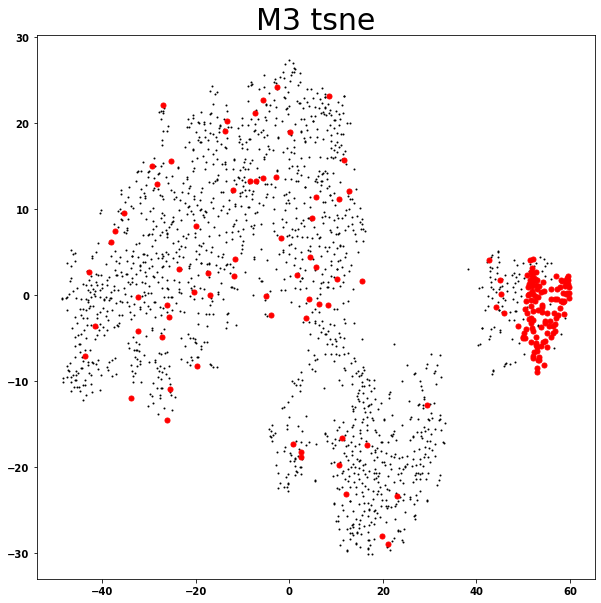

In [41]:
tsne_x_M3_ctrl = tsne_control_X[11][0]
tsne_y_M3_ctrl = tsne_control_Y[11][0]
tsne_x_M3_all = tsne_all_X[11]
tsne_y_M3_all = tsne_all_Y[11]

fig = plt.figure(figsize=(10,10))
plt.plot(tsne_x_M3_all, tsne_y_M3_all, 'ok', ms='1')
plt.plot(tsne_x_M3_ctrl, tsne_y_M3_ctrl, 'or', ms='5')
plt.title('M3 tsne', fontsize=30)

##### on control stars

In [211]:
M3_tsne_X_ctrl = np.c_[tsne_x_M3_ctrl, tsne_y_M3_ctrl]


clustering_tsne_M3_ctrl = DBSCAN(eps=3, min_samples = 10).fit(M3_tsne_X_ctrl)
labels_tsne_M3_ctrl = clustering_tsne_M3_ctrl.labels_

n_clusters_tsne_M3_ctrl = len(set(labels_tsne_M3_ctrl)) - (1 if -1 in labels_tsne_M3_ctrl else 0)

unique_labels_tsne_M3_ctrl = set(labels_tsne_M3_ctrl)
core_samples_mask_tsne_M3_ctrl = np.zeros_like(labels_tsne_M3_ctrl, dtype=bool)
core_samples_mask_tsne_M3_ctrl[clustering_tsne_M3_ctrl.core_sample_indices_] = True

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_tsne_M3_ctrl))]

fig = plt.figure(figsize=(20,20))

for k, col in zip(unique_labels_tsne_M3_ctrl, colors):
    if k == -1:
        # Black used for noise.
        lab = 'Noise'
        col = [0, 0, 0, 1]
    else:
        lab = 'Group ' + str(k)

    class_member_mask = labels_tsne_M3_ctrl == k
    
    xy = M3_X_ctrl[class_member_mask & core_samples_mask_tsne_M3_ctrl]
    
    print('M3 ctrl stars:\teps = 3, min_samples = 10\tStars in group ' + lab + ': \033[1m' + str(len(xy)) + '\033[0m')
    
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
        label=lab
    )

    xy = M3_X_ctrl[class_member_mask & ~core_samples_mask_M3_ctrl]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )
plt.xlabel('tsne X', fontsize=20)
plt.ylabel('tsne Y', fontsize=20)
plt.legend(fontsize=20)
plt.title(f"M3 tsne ctrl Stars\nEstimated number of clusters: {n_clusters_M3_ctrl}", fontsize=30)
plt.show()

##### on all stars

In [214]:
M3_tsne_X_all = np.c_[tsne_x_M3_all, tsne_y_M3_all]


clustering_tsne_M3_all = DBSCAN(eps=3, min_samples = 10).fit(M3_tsne_X_all)
labels_tsne_M3_all = clustering_tsne_M3_all.labels_

n_clusters_tsne_M3_all = len(set(labels_tsne_M3_all)) - (1 if -1 in labels_tsne_M3_all else 0)

M3 ctrl stars:	eps = 3, min_samples = 10	Stars in group Group 0: 1495
M3 ctrl stars:	eps = 3, min_samples = 10	Stars in group Group 1: 45
M3 ctrl stars:	eps = 3, min_samples = 10	Stars in group Group 2: 210
M3 ctrl stars:	eps = 3, min_samples = 10	Stars in group Group 3: 6
M3 ctrl stars:	eps = 3, min_samples = 10	Stars in group Group 4: 1
M3 ctrl stars:	eps = 3, min_samples = 10	Stars in group Noise: 0


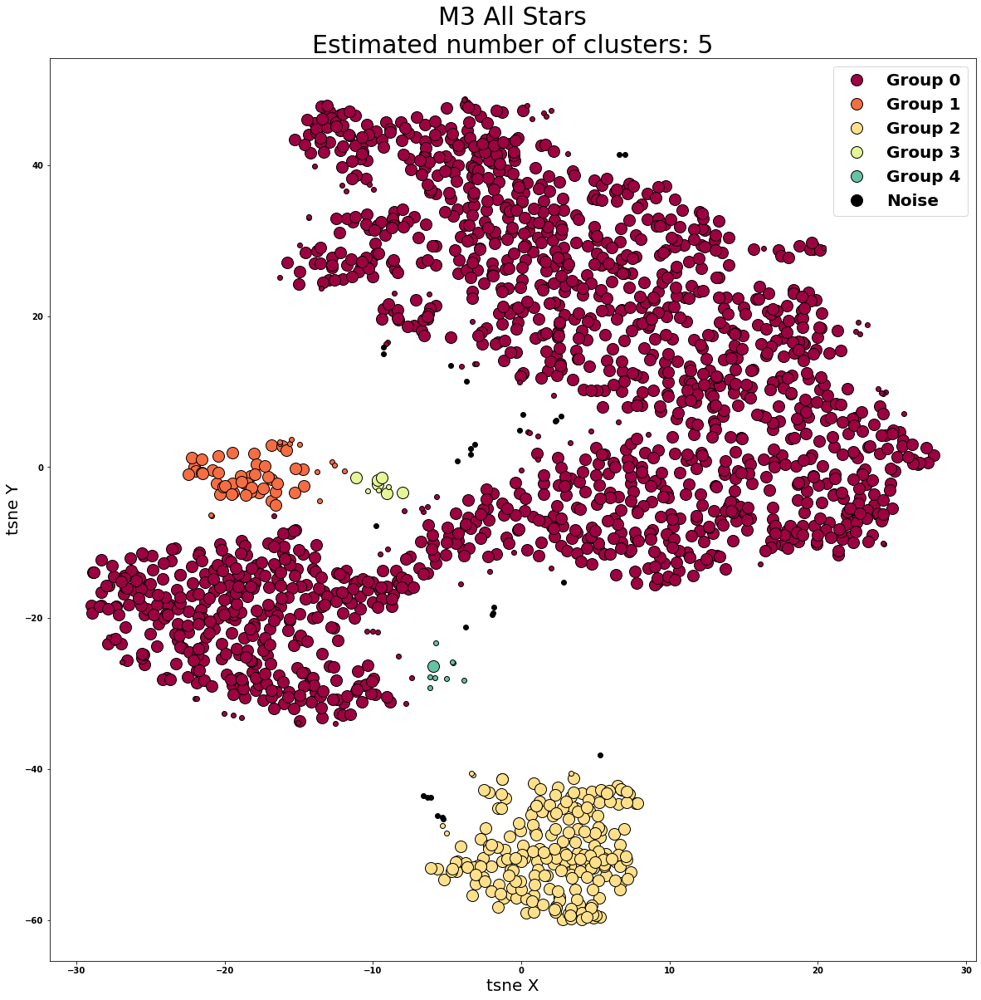

In [220]:
unique_labels_tsne_M3_all = set(labels_tsne_M3_all)
core_samples_mask_tsne_M3_all = np.zeros_like(labels_tsne_M3_all, dtype=bool)
core_samples_mask_tsne_M3_all[clustering_tsne_M3_all.core_sample_indices_] = True

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_tsne_M3_all))]

fig = plt.figure(figsize=(20,20))

for k, col in zip(unique_labels_tsne_M3_all, colors):
    if k == -1:
        # Black used for noise.
        lab = 'Noise'
        col = [0, 0, 0, 1]
    else:
        lab = 'Group ' + str(k)
    
    class_member_mask = labels_tsne_M3_all == k
    
    xy = M3_tsne_X_all[class_member_mask & core_samples_mask_tsne_M3_all]
    
    print('M3 ctrl stars:\teps = 3, min_samples = 10\tStars in group ' + lab + ': \033[1m' + str(len(xy)) + '\033[0m')
    
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
        label=lab
    )

    xy = M3_tsne_X_all[class_member_mask & ~core_samples_mask_tsne_M3_all]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )
plt.xlabel('tsne X', fontsize=20)
plt.ylabel('tsne Y', fontsize=20)
plt.legend(fontsize=20)
plt.title(f"M3 All Stars\nEstimated number of clusters: {n_clusters_tsne_M3_all}", fontsize=30)
plt.show()

#### Testing diff hyperparameters for M3 tsne

##### changing min_samples for ctrl M3 stars

In [48]:
M3_tsne_X_ctrl = np.c_[tsne_x_M3_ctrl, tsne_y_M3_ctrl]

samps_arr_M3_tsne = np.arange(5, 20, 1)
clusterings_M3_tsne_ctrl_lst = []
labels_M3_tsne_ctrl_lst = []
n_clusters_M3_tsne_ctrl_lst = []

for i in samps_arr_M3_tsne:
    db = DBSCAN(eps=3, min_samples = i).fit(M3_tsne_X_ctrl)
    clusterings_M3_tsne_ctrl_lst.append(db)
    labels_M3_tsne_ctrl_lst.append(db.labels_)
    n_clusters_M3_tsne_ctrl_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))

In [49]:
print(len(samps_arr_M3_tsne))

15


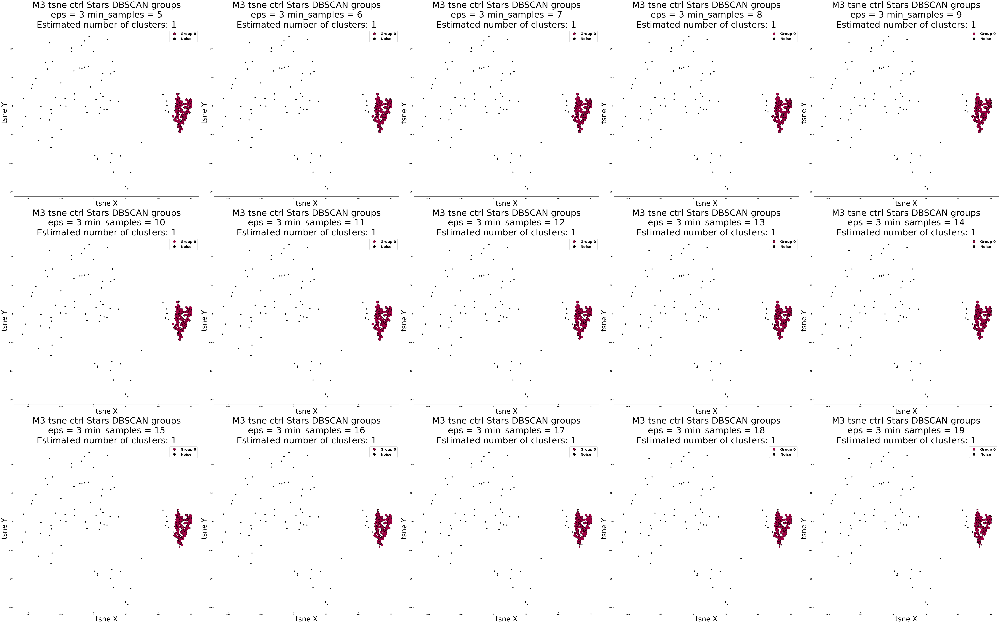

In [50]:
unique_labels_M3_tsne_ctrl_lst = []
core_samples_masks_M3_tsne_ctrl_lst = []
colors_M3_tsne_ctrl_lst = []

for i in range(len(labels_M3_tsne_ctrl_lst)):
    unique_labels_M3_tsne_ctrl_lst.append(set(labels_M3_tsne_ctrl_lst[i]))
    core_samples_masks_M3_tsne_ctrl_lst.append(np.zeros_like(labels_M3_tsne_ctrl_lst[i], dtype=bool))
    core_samples_masks_M3_tsne_ctrl_lst[i][clusterings_M3_tsne_ctrl_lst[i].core_sample_indices_] = True

    colors_M3_tsne_ctrl_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_M3_tsne_ctrl_lst[i]))])

fig, ax = plt.subplots(3, 5, figsize=(80,50))

for i in range(5):
    for j in range(3):
        for k, col in zip(unique_labels_M3_tsne_ctrl_lst[i + 5*j], colors_M3_tsne_ctrl_lst[i + 5*j]):
            if k == -1:
                # Black used for noise.
                lab = 'Noise'
                col = [0, 0, 0, 1]
            else:
                lab = 'Group ' + str(k)

            class_member_mask = labels_M3_tsne_ctrl_lst[i + 5*j] == k

            xy = M3_tsne_X_ctrl[class_member_mask & core_samples_masks_M3_tsne_ctrl_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=14,
                label=lab
            )

            xy = M3_tsne_X_ctrl[class_member_mask & ~core_samples_masks_M3_tsne_ctrl_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=6,
            )
        
        ax[j][i].set_xlabel('tsne X', fontsize=40)
        ax[j][i].set_ylabel('tsne Y', fontsize=40)
        ax[j][i].legend(fontsize=20)
        ax[j][i].set_title(f'M3 tsne ctrl Stars DBSCAN groups\neps = 3 min_samples = ' + str(round(samps_arr_M3_tsne[i + 5*j], 2)) +  f"\nEstimated number of clusters: {n_clusters_M3_tsne_ctrl_lst[i + 5*j]}", fontsize=50)

plt.tight_layout()
plt.savefig('dbscan_M3_tsne_ctrl_samps.png')
plt.show()

##### changing eps for all M3 stars

In [51]:
M3_tsne_X_all = np.c_[tsne_x_M3_all, tsne_y_M3_all]

samps_arr_M3_tsne = np.arange(5, 20, 1)
clusterings_M3_tsne_all_lst = []
labels_M3_tsne_all_lst = []
n_clusters_M3_tsne_all_lst = []

for i in samps_arr_M3_tsne:
    db = DBSCAN(eps=3, min_samples = i).fit(M3_tsne_X_all)
    clusterings_M3_tsne_all_lst.append(db)
    labels_M3_tsne_all_lst.append(db.labels_)
    n_clusters_M3_tsne_all_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))

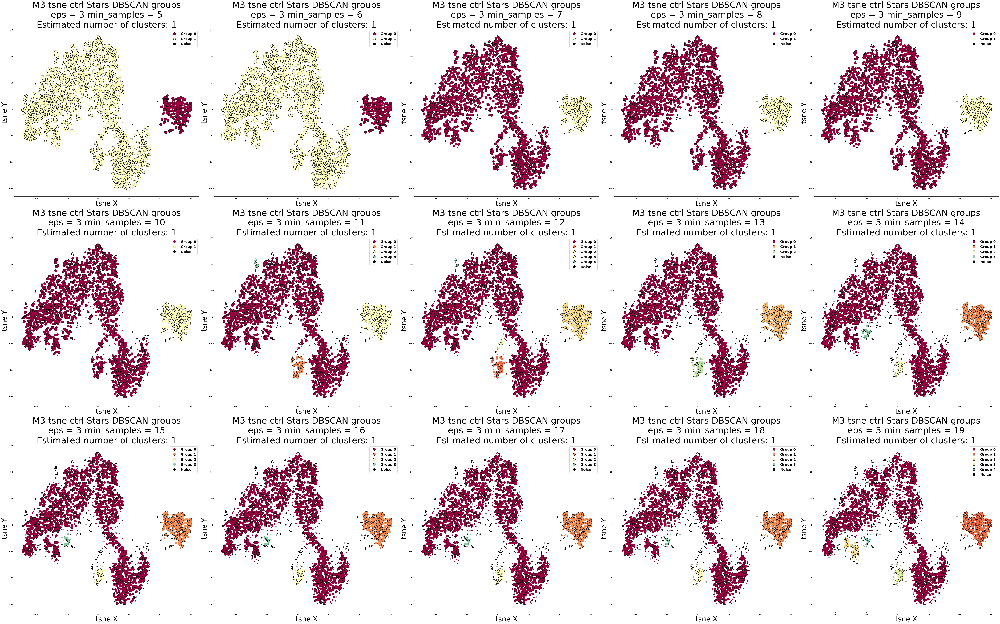

In [52]:
unique_labels_M3_tsne_all_lst = []
core_samples_masks_M3_tsne_all_lst = []
colors_M3_tsne_all_lst = []

for i in range(len(labels_M3_tsne_all_lst)):
    unique_labels_M3_tsne_all_lst.append(set(labels_M3_tsne_all_lst[i]))
    core_samples_masks_M3_tsne_all_lst.append(np.zeros_like(labels_M3_tsne_all_lst[i], dtype=bool))
    core_samples_masks_M3_tsne_all_lst[i][clusterings_M3_tsne_all_lst[i].core_sample_indices_] = True

    colors_M3_tsne_all_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_M3_tsne_all_lst[i]))])

fig, ax = plt.subplots(3, 5, figsize=(80,50))

for i in range(5):
    for j in range(3):
        for k, col in zip(unique_labels_M3_tsne_all_lst[i + 5*j], colors_M3_tsne_all_lst[i + 5*j]):
            if k == -1:
                # Black used for noise.
                lab = 'Noise'
                col = [0, 0, 0, 1]
            else:
                lab = 'Group ' + str(k)

            class_member_mask = labels_M3_tsne_all_lst[i + 5*j] == k

            xy = M3_tsne_X_all[class_member_mask & core_samples_masks_M3_tsne_all_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=14,
                label=lab
            )

            xy = M3_tsne_X_all[class_member_mask & ~core_samples_masks_M3_tsne_all_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=6,
            )
        
        ax[j][i].set_xlabel('tsne X', fontsize=40)
        ax[j][i].set_ylabel('tsne Y', fontsize=40)
        ax[j][i].legend(fontsize=20)
        ax[j][i].set_title(f'M3 tsne ctrl Stars DBSCAN groups\neps = 3 min_samples = ' + str(round(samps_arr_M3_tsne[i + 5*j], 2)) +  f"\nEstimated number of clusters: {n_clusters_M3_tsne_ctrl_lst[i + 5*j]}", fontsize=50)

plt.tight_layout()
plt.savefig('dbscan_M3_tsne_all_samps.png')
plt.show()

#### umap

Text(0.5, 1.0, 'M3 umap')

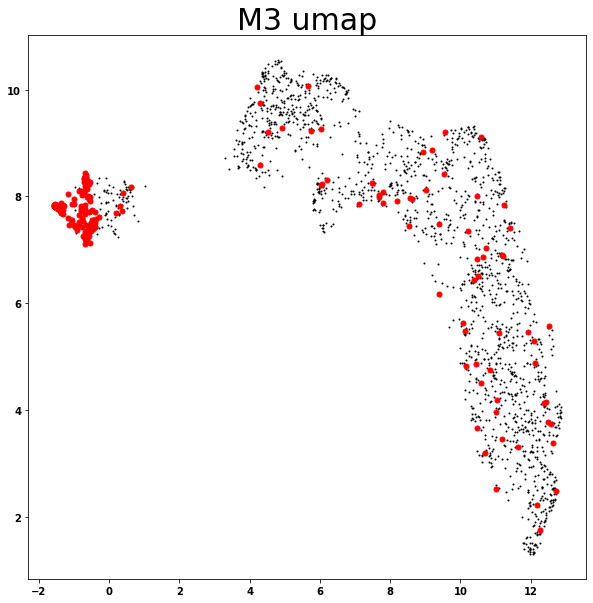

In [55]:
umap_x_M3_ctrl = umap_control_X[11][0]
umap_y_M3_ctrl = umap_control_Y[11][0]
umap_x_M3_all = umap_all_X[11]
umap_y_M3_all = umap_all_Y[11]

fig = plt.figure(figsize=(10,10))
plt.plot(umap_x_M3_all, umap_y_M3_all, 'ok', ms='1')
plt.plot(umap_x_M3_ctrl, umap_y_M3_ctrl, 'or', ms='5')
plt.title('M3 umap', fontsize=30)

##### on ctrl stars

In [236]:
M3_umap_X_ctrl = np.c_[umap_x_M3_ctrl, umap_y_M3_ctrl]


clustering_umap_M3_ctrl = DBSCAN(eps=2, min_samples = 10).fit(M3_umap_X_ctrl)
labels_umap_M3_ctrl = clustering_umap_M3_ctrl.labels_

n_clusters_umap_M3_ctrl = len(set(labels_umap_M3_ctrl)) - (1 if -1 in labels_umap_M3_ctrl else 0)

M3 ctrl stars:	eps = 2, min_samples = 10	Stars in group Group 0: 61
M3 ctrl stars:	eps = 2, min_samples = 10	Stars in group Group 1: 118


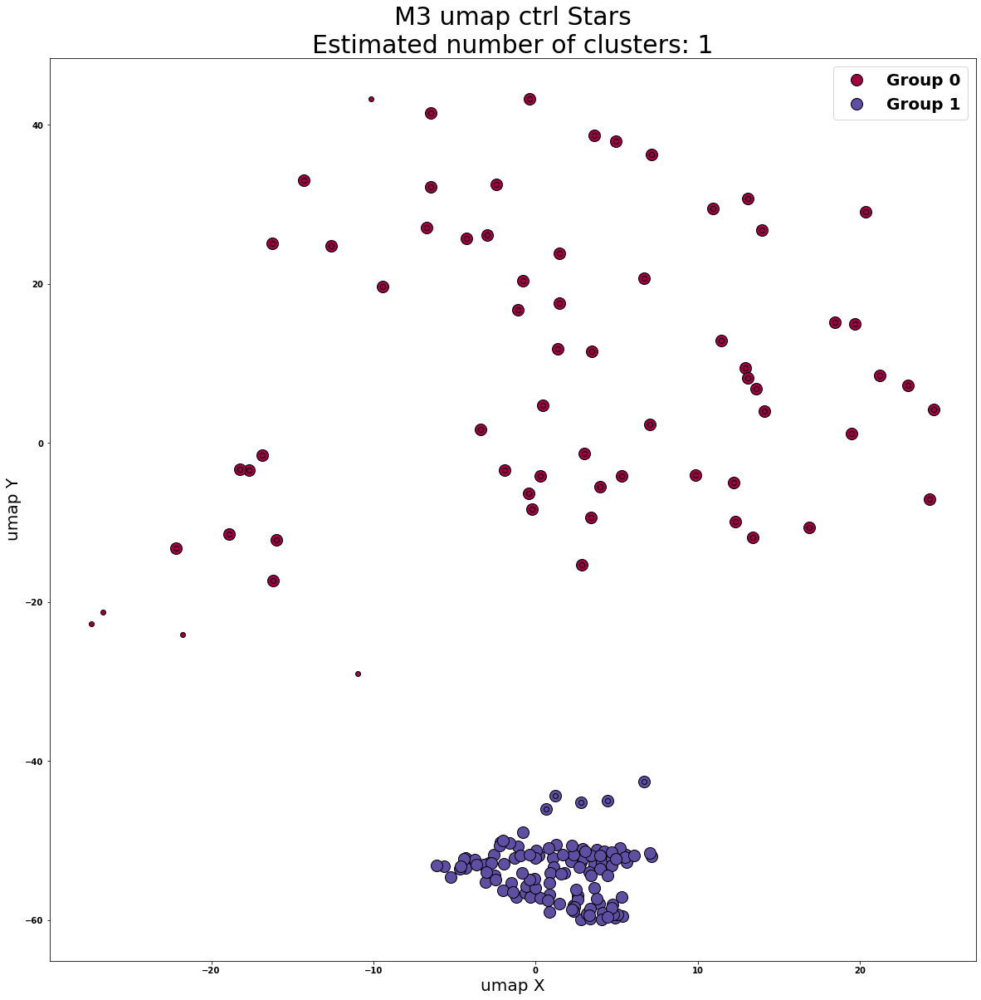

In [237]:
unique_labels_umap_M3_ctrl = set(labels_umap_M3_ctrl)
core_samples_mask_umap_M3_ctrl = np.zeros_like(labels_umap_M3_ctrl, dtype=bool)
core_samples_mask_umap_M3_ctrl[clustering_umap_M3_ctrl.core_sample_indices_] = True

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_umap_M3_ctrl))]

fig = plt.figure(figsize=(20,20))

for k, col in zip(unique_labels_umap_M3_ctrl, colors):
    if k == -1:
        # Black used for noise.
        lab = 'Noise'
        col = [0, 0, 0, 1]
    else:
        lab = 'Group ' + str(k)

    class_member_mask = labels_umap_M3_ctrl == k
    
    xy = M3_X_ctrl[class_member_mask & core_samples_mask_umap_M3_ctrl]
    
    print('M3 ctrl stars:\teps = 2, min_samples = 10\tStars in group ' + lab + ': \033[1m' + str(len(xy)) + '\033[0m')
    
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
        label=lab
    )

    xy = M3_X_ctrl[class_member_mask & ~core_samples_mask_M3_ctrl]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )
plt.xlabel('umap X', fontsize=20)
plt.ylabel('umap Y', fontsize=20)
plt.legend(fontsize=20)
plt.title(f"M3 umap ctrl Stars\nEstimated number of clusters: {n_clusters_M3_ctrl}", fontsize=30)
plt.show()

##### on all stars

In [233]:
M3_umap_X_all = np.c_[umap_x_M3_all, umap_y_M3_all]


clustering_umap_M3_all = DBSCAN(eps=2, min_samples = 10).fit(M3_umap_X_all)
labels_umap_M3_all = clustering_umap_M3_all.labels_

n_clusters_umap_M3_all = len(set(labels_umap_M3_all)) - (1 if -1 in labels_umap_M3_all else 0)

M3 ctrl stars:	eps = 2, min_samples = 10	Stars in group Group 0: 1671
M3 ctrl stars:	eps = 2, min_samples = 10	Stars in group Group 1: 220


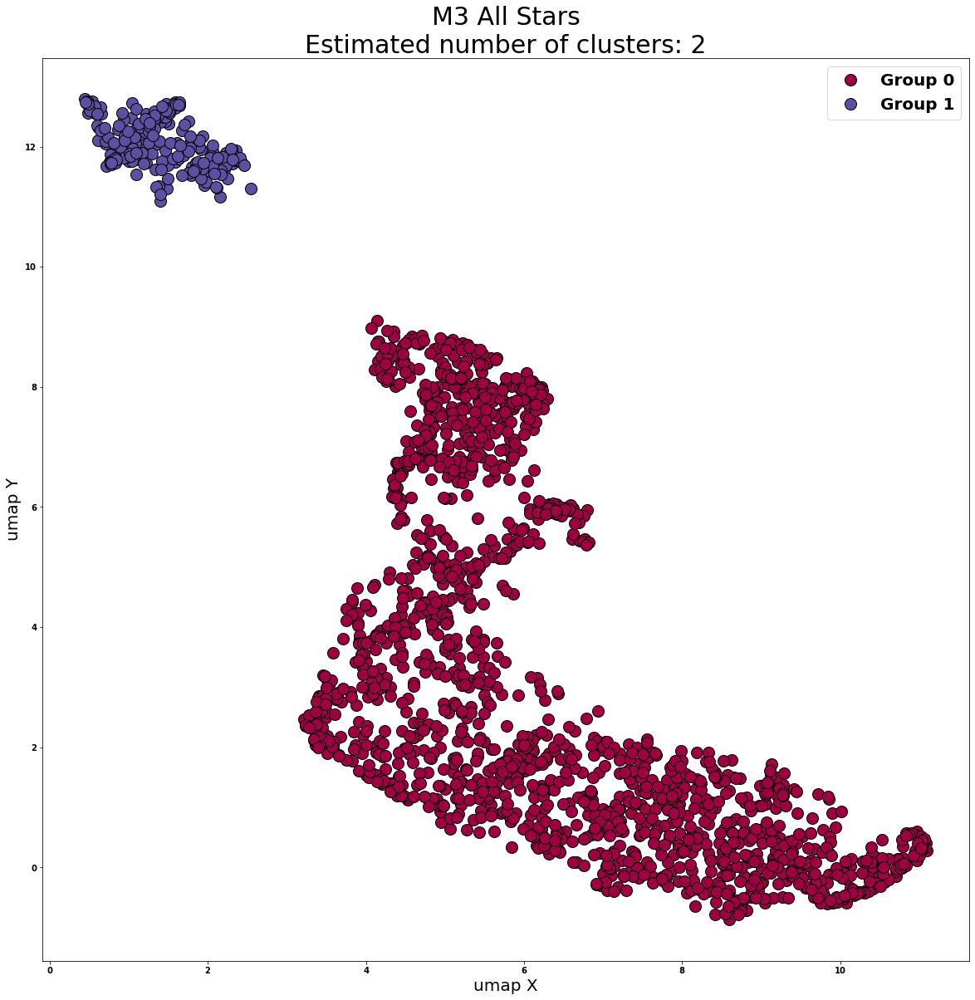

In [235]:
unique_labels_umap_M3_all = set(labels_umap_M3_all)
core_samples_mask_umap_M3_all = np.zeros_like(labels_umap_M3_all, dtype=bool)
core_samples_mask_umap_M3_all[clustering_umap_M3_all.core_sample_indices_] = True

colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_umap_M3_all))]

fig = plt.figure(figsize=(20,20))

for k, col in zip(unique_labels_umap_M3_all, colors):
    if k == -1:
        # Black used for noise.
        lab = 'Noise'
        col = [0, 0, 0, 1]
    else:
        lab = 'Group ' + str(k)
    
    class_member_mask = labels_umap_M3_all == k
    
    xy = M3_umap_X_all[class_member_mask & core_samples_mask_umap_M3_all]
    
    print('M3 ctrl stars:\teps = 2, min_samples = 10\tStars in group ' + lab + ': \033[1m' + str(len(xy)) + '\033[0m')
    
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=14,
        label=lab
    )

    xy = M3_umap_X_all[class_member_mask & ~core_samples_mask_umap_M3_all]
    plt.plot(
        xy[:, 0],
        xy[:, 1],
        "o",
        markerfacecolor=tuple(col),
        markeredgecolor="k",
        markersize=6,
    )
plt.xlabel('umap X', fontsize=20)
plt.ylabel('umap Y', fontsize=20)
plt.legend(fontsize=20)
plt.title(f"M3 All Stars\nEstimated number of clusters: {n_clusters_umap_M3_all}", fontsize=30)
plt.show()

#### Testing diff hyperparameters for M3 umap

##### changing eps for ctrl M3 stars

In [56]:
M3_umap_X_ctrl = np.c_[umap_x_M3_ctrl, umap_y_M3_ctrl]

#eps_arr_M3_umap = np.arange(0.5, 6.5, 0.4)
samps_arr_M3_umap = np.arange(5, 20, 1)
clusterings_M3_umap_ctrl_lst = []
labels_M3_umap_ctrl_lst = []
n_clusters_M3_umap_ctrl_lst = []

for i in samps_arr_M3_umap:
    db = DBSCAN(eps=2, min_samples = i).fit(M3_umap_X_ctrl)
    clusterings_M3_umap_ctrl_lst.append(db)
    labels_M3_umap_ctrl_lst.append(db.labels_)
    n_clusters_M3_umap_ctrl_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))

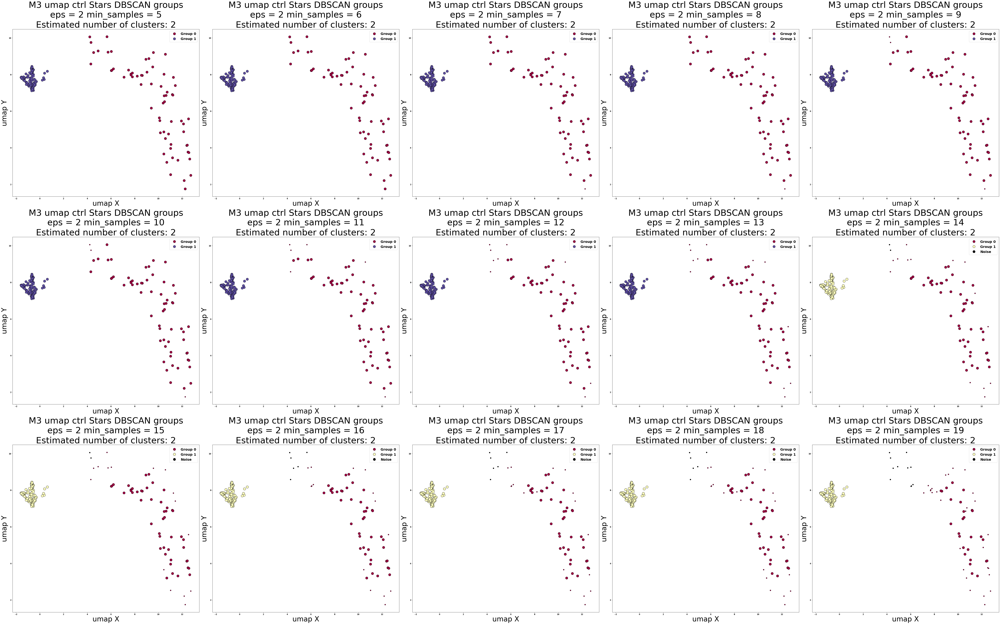

In [57]:
unique_labels_M3_umap_ctrl_lst = []
core_samples_masks_M3_umap_ctrl_lst = []
colors_M3_umap_ctrl_lst = []

for i in range(len(labels_M3_umap_ctrl_lst)):
    unique_labels_M3_umap_ctrl_lst.append(set(labels_M3_umap_ctrl_lst[i]))
    core_samples_masks_M3_umap_ctrl_lst.append(np.zeros_like(labels_M3_umap_ctrl_lst[i], dtype=bool))
    core_samples_masks_M3_umap_ctrl_lst[i][clusterings_M3_umap_ctrl_lst[i].core_sample_indices_] = True

    colors_M3_umap_ctrl_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_M3_umap_ctrl_lst[i]))])

fig, ax = plt.subplots(3, 5, figsize=(80,50))

for i in range(5):
    for j in range(3):
        for k, col in zip(unique_labels_M3_umap_ctrl_lst[i + 5*j], colors_M3_umap_ctrl_lst[i + 5*j]):
            if k == -1:
                # Black used for noise.
                lab = 'Noise'
                col = [0, 0, 0, 1]
            else:
                lab = 'Group ' + str(k)

            class_member_mask = labels_M3_umap_ctrl_lst[i + 5*j] == k

            xy = M3_umap_X_ctrl[class_member_mask & core_samples_masks_M3_umap_ctrl_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=14,
                label=lab
            )

            xy = M3_umap_X_ctrl[class_member_mask & ~core_samples_masks_M3_umap_ctrl_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=6,
            )
        
        ax[j][i].set_xlabel('umap X', fontsize=40)
        ax[j][i].set_ylabel('umap Y', fontsize=40)
        ax[j][i].legend(fontsize=20)
        ax[j][i].set_title(f'M3 umap ctrl Stars DBSCAN groups\neps = 2 min_samples = ' + str(round(samps_arr_M3_umap[i + 5*j], 2)) +  f"\nEstimated number of clusters: {n_clusters_M3_umap_ctrl_lst[i + 5*j]}", fontsize=50)

plt.tight_layout()
plt.savefig('dbscan_M3_umap_ctrl_samps.png')
plt.show()

##### changing eps for all M3 stars

In [58]:
M3_umap_X_all = np.c_[umap_x_M3_all, umap_y_M3_all]

#eps_arr_M3_umap = np.arange(0.5, 6.5, 0.4)
samps_arr_M3_umap = np.arange(5, 20
                              , 1)
clusterings_M3_umap_all_lst = []
labels_M3_umap_all_lst = []
n_clusters_M3_umap_all_lst = []

for i in samps_arr_M3_umap:
    db = DBSCAN(eps=2, min_samples = i).fit(M3_umap_X_all)
    clusterings_M3_umap_all_lst.append(db)
    labels_M3_umap_all_lst.append(db.labels_)
    n_clusters_M3_umap_all_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))

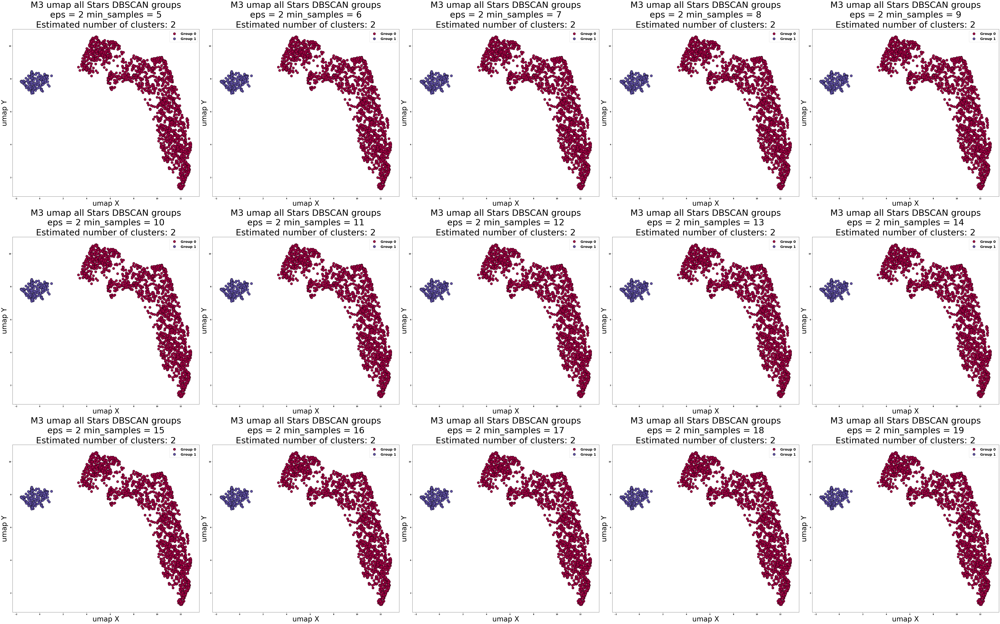

In [60]:
unique_labels_M3_umap_all_lst = []
core_samples_masks_M3_umap_all_lst = []
colors_M3_umap_all_lst = []

for i in range(len(labels_M3_umap_all_lst)):
    unique_labels_M3_umap_all_lst.append(set(labels_M3_umap_all_lst[i]))
    core_samples_masks_M3_umap_all_lst.append(np.zeros_like(labels_M3_umap_all_lst[i], dtype=bool))
    core_samples_masks_M3_umap_all_lst[i][clusterings_M3_umap_all_lst[i].core_sample_indices_] = True

    colors_M3_umap_all_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_M3_umap_all_lst[i]))])

fig, ax = plt.subplots(3, 5, figsize=(80,50))

for i in range(5):
    for j in range(3):
        for k, col in zip(unique_labels_M3_umap_all_lst[i + 5*j], colors_M3_umap_all_lst[i + 5*j]):
            if k == -1:
                # Black used for noise.
                lab = 'Noise'
                col = [0, 0, 0, 1]
            else:
                lab = 'Group ' + str(k)

            class_member_mask = labels_M3_umap_all_lst[i + 5*j] == k

            xy = M3_umap_X_all[class_member_mask & core_samples_masks_M3_umap_all_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=14,
                label=lab
            )

            xy = M3_umap_X_all[class_member_mask & ~core_samples_masks_M3_umap_all_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=6,
            )
        
        ax[j][i].set_xlabel('umap X', fontsize=40)
        ax[j][i].set_ylabel('umap Y', fontsize=40)
        ax[j][i].legend(fontsize=20)
        ax[j][i].set_title(f'M3 umap all Stars DBSCAN groups\neps = 2 min_samples = ' + str(round(samps_arr_M3_umap[i + 5*j], 2)) +  f"\nEstimated number of clusters: {n_clusters_M3_umap_ctrl_lst[i + 5*j]}", fontsize=50)

plt.tight_layout()
plt.savefig('dbscan_M3_umap_all_samps.png')
plt.show()

## Now DBSCAN all of the stars and save the figures to their own folders

In [64]:
def plot_ML(name, tsne, umap):
    
    fig = plt.figure(figsize=(10,10))
    plt.plot(tsne[2], tsne[3], 'ok', ms='1') # all
    plt.plot(tsne[0], tsne[1], 'or', ms='5') # ctrl
    plt.title(name + ' tsne', fontsize=30)
    plt.savefig('GCs_DBSCAN/' + name + '/tsne.png')
    
    fig = plt.figure(figsize=(10,10))
    plt.plot(umap[2], umap[3], 'ok', ms='1') # all
    plt.plot(umap[0], umap[1], 'or', ms='5') # ctrl
    plt.title(name + ' umap', fontsize=30)
    plt.savefig('GCs_DBSCAN/' + name + '/umap.png')

In [65]:
def db_ctrl_tsne(name, tsne_X_ctrl):
    plt.close('all')
    eps_arr_tsne = np.arange(0.5, 6.5, 0.4)
    clusterings_tsne_ctrl_lst = []
    labels_tsne_ctrl_lst = []
    n_clusters_tsne_ctrl_lst = []

    for i in eps_arr_tsne:
        db = DBSCAN(eps=i, min_samples = 10).fit(tsne_X_ctrl)
        clusterings_tsne_ctrl_lst.append(db)
        labels_tsne_ctrl_lst.append(db.labels_)
        n_clusters_tsne_ctrl_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))
    
    unique_labels_tsne_ctrl_lst = []
    core_samples_masks_tsne_ctrl_lst = []
    colors_tsne_ctrl_lst = []

    for i in range(len(labels_tsne_ctrl_lst)):
        unique_labels_tsne_ctrl_lst.append(set(labels_tsne_ctrl_lst[i]))
        core_samples_masks_tsne_ctrl_lst.append(np.zeros_like(labels_tsne_ctrl_lst[i], dtype=bool))
        core_samples_masks_tsne_ctrl_lst[i][clusterings_tsne_ctrl_lst[i].core_sample_indices_] = True

        colors_tsne_ctrl_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_tsne_ctrl_lst[i]))])

    fig, ax = plt.subplots(3, 5, figsize=(80,50))

    for i in range(5):
        for j in range(3):
            for k, col in zip(unique_labels_tsne_ctrl_lst[i + 5*j], colors_tsne_ctrl_lst[i + 5*j]):
                if k == -1:
                    # Black used for noise.
                    lab = 'Noise'
                    col = [0, 0, 0, 1]
                else:
                    lab = 'Group ' + str(k)

                class_member_mask = labels_tsne_ctrl_lst[i + 5*j] == k

                xy = tsne_X_ctrl[class_member_mask & core_samples_masks_tsne_ctrl_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=14,
                    label=lab
                )

                xy = tsne_X_ctrl[class_member_mask & ~core_samples_masks_tsne_ctrl_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=6,
                )

            ax[j][i].set_xlabel('tsne X', fontsize=40)
            ax[j][i].set_ylabel('tsne Y', fontsize=40)
            ax[j][i].legend(fontsize=20)
            ax[j][i].set_title(name + f" tsne ctrl Stars DBSCAN groups\neps = " + str(round(eps_arr_tsne[i + 5*j], 2)) + ' min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_tsne_ctrl_lst[i + 5*j]}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN/' + name + '/db_tsne_ctrl.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_tsne_cctrl_all

In [66]:
def db_all_tsne(name, tsne_X_all):
    plt.close('all')
    eps_arr_tsne = np.arange(0.5, 6.5, 0.4)
    clusterings_tsne_all_lst = []
    labels_tsne_all_lst = []
    n_clusters_tsne_all_lst = []

    for i in eps_arr_tsne:
        db = DBSCAN(eps=i, min_samples = 10).fit(tsne_X_all)
        clusterings_tsne_all_lst.append(db)
        labels_tsne_all_lst.append(db.labels_)
        n_clusters_tsne_all_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))
    
    unique_labels_tsne_all_lst = []
    core_samples_masks_tsne_all_lst = []
    colors_tsne_all_lst = []

    for i in range(len(labels_tsne_all_lst)):
        unique_labels_tsne_all_lst.append(set(labels_tsne_all_lst[i]))
        core_samples_masks_tsne_all_lst.append(np.zeros_like(labels_tsne_all_lst[i], dtype=bool))
        core_samples_masks_tsne_all_lst[i][clusterings_tsne_all_lst[i].core_sample_indices_] = True

        colors_tsne_all_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_tsne_all_lst[i]))])

    fig, ax = plt.subplots(3, 5, figsize=(80,50))

    for i in range(5):
        for j in range(3):
            for k, col in zip(unique_labels_tsne_all_lst[i + 5*j], colors_tsne_all_lst[i + 5*j]):
                if k == -1:
                    # Black used for noise.
                    lab = 'Noise'
                    col = [0, 0, 0, 1]
                else:
                    lab = 'Group ' + str(k)

                class_member_mask = labels_tsne_all_lst[i + 5*j] == k

                xy = tsne_X_all[class_member_mask & core_samples_masks_tsne_all_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=14,
                    label=lab
                )

                xy = tsne_X_all[class_member_mask & ~core_samples_masks_tsne_all_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=6,
                )

            ax[j][i].set_xlabel('tsne X', fontsize=40)
            ax[j][i].set_ylabel('tsne Y', fontsize=40)
            ax[j][i].legend(fontsize=20)
            ax[j][i].set_title(name + f" tsne all Stars DBSCAN groups\neps = " + str(round(eps_arr_tsne[i + 5*j], 2)) + ' min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_tsne_all_lst[i + 5*j]}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN/' + name + '/db_tsne_all.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_tsne_all_list

In [70]:
def db_ctrl_umap(name, umap_X_ctrl):
    plt.close('all')
    eps_arr_umap = np.arange(0.1, 3., 0.2)
    clusterings_umap_ctrl_lst = []
    labels_umap_ctrl_lst = []
    n_clusters_umap_ctrl_lst = []

    for i in eps_arr_umap:
        db = DBSCAN(eps=i, min_samples = 10).fit(umap_X_ctrl)
        clusterings_umap_ctrl_lst.append(db)
        labels_umap_ctrl_lst.append(db.labels_)
        n_clusters_umap_ctrl_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))
    
    unique_labels_umap_ctrl_lst = []
    core_samples_masks_umap_ctrl_lst = []
    colors_umap_ctrl_lst = []

    for i in range(len(labels_umap_ctrl_lst)):
        unique_labels_umap_ctrl_lst.append(set(labels_umap_ctrl_lst[i]))
        core_samples_masks_umap_ctrl_lst.append(np.zeros_like(labels_umap_ctrl_lst[i], dtype=bool))
        core_samples_masks_umap_ctrl_lst[i][clusterings_umap_ctrl_lst[i].core_sample_indices_] = True

        colors_umap_ctrl_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_umap_ctrl_lst[i]))])

    fig, ax = plt.subplots(3, 5, figsize=(80,50))

    for i in range(5):
        for j in range(3):
            for k, col in zip(unique_labels_umap_ctrl_lst[i + 5*j], colors_umap_ctrl_lst[i + 5*j]):
                if k == -1:
                    # Black used for noise.
                    lab = 'Noise'
                    col = [0, 0, 0, 1]
                else:
                    lab = 'Group ' + str(k)

                class_member_mask = labels_umap_ctrl_lst[i + 5*j] == k

                xy = umap_X_ctrl[class_member_mask & core_samples_masks_umap_ctrl_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=14,
                    label=lab
                )

                xy = umap_X_ctrl[class_member_mask & ~core_samples_masks_umap_ctrl_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=6,
                )

            ax[j][i].set_xlabel('umap X', fontsize=40)
            ax[j][i].set_ylabel('umap Y', fontsize=40)
            ax[j][i].legend(fontsize=20)
            ax[j][i].set_title(name + f" umap ctrl Stars DBSCAN groups\neps = " + str(round(eps_arr_umap[i + 5*j], 2)) + ' min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_umap_ctrl_lst[i + 5*j]}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN/' + name + '/db_umap_ctrl.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_umap_ctrl_list

In [71]:
def db_all_umap(name, umap_X_all):
    plt.close('all')
    eps_arr_umap = np.arange(0.1, 3., 0.2)
    clusterings_umap_all_lst = []
    labels_umap_all_lst = []
    n_clusters_umap_all_lst = []

    for i in eps_arr_umap:
        db = DBSCAN(eps=i, min_samples = 10).fit(umap_X_all)
        clusterings_umap_all_lst.append(db)
        labels_umap_all_lst.append(db.labels_)
        n_clusters_umap_all_lst.append(len(set(db.labels_)) - (1 if -1 in db.labels_ else 0))
    
    unique_labels_umap_all_lst = []
    core_samples_masks_umap_all_lst = []
    colors_umap_all_lst = []

    for i in range(len(labels_umap_all_lst)):
        unique_labels_umap_all_lst.append(set(labels_umap_all_lst[i]))
        core_samples_masks_umap_all_lst.append(np.zeros_like(labels_umap_all_lst[i], dtype=bool))
        core_samples_masks_umap_all_lst[i][clusterings_umap_all_lst[i].core_sample_indices_] = True

        colors_umap_all_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_umap_all_lst[i]))])

    fig, ax = plt.subplots(3, 5, figsize=(80,50))

    for i in range(5):
        for j in range(3):
            for k, col in zip(unique_labels_umap_all_lst[i + 5*j], colors_umap_all_lst[i + 5*j]):
                if k == -1:
                    # Black used for noise.
                    lab = 'Noise'
                    col = [0, 0, 0, 1]
                else:
                    lab = 'Group ' + str(k)

                class_member_mask = labels_umap_all_lst[i + 5*j] == k

                xy = umap_X_all[class_member_mask & core_samples_masks_umap_all_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=14,
                    label=lab
                )

                xy = umap_X_all[class_member_mask & ~core_samples_masks_umap_all_lst[i + 5*j]]
                ax[j][i].plot(
                    xy[:, 0],
                    xy[:, 1],
                    "o",
                    markerfacecolor=tuple(col),
                    markeredgecolor="k",
                    markersize=6,
                )

            ax[j][i].set_xlabel('umap X', fontsize=40)
            ax[j][i].set_ylabel('umap Y', fontsize=40)
            ax[j][i].legend(fontsize=20)
            ax[j][i].set_title(name + f" umap all Stars DBSCAN groups\neps = " + str(round(eps_arr_umap[i + 5*j], 2)) + ' min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_umap_all_lst[i + 5*j]}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN/' + name + '/db_umap_all.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_umap_all_list

Directory NGC_104 already exists
Done NGC_104
Directory NGC_288 already exists
Done NGC_288
Directory NGC_362 already exists
Done NGC_362
Directory NGC_1851 already exists
Done NGC_1851
Directory NGC_1904 already exists
Done NGC_1904
Directory NGC_2298 already exists
Done NGC_2298
Done NGC_2808
Done NGC_3201
Done NGC_4590
Done NGC_5024
Done NGC_5053
Done NGC_5272
Done NGC_5466
Done NGC_5904
Done NGC_6121
Done NGC_6171
Done NGC_6205
Done NGC_6218
Done NGC_6229
Done NGC_6254
Done NGC_6273
Done NGC_6293
Done NGC_6341
Done NGC_6388
Done NGC_6397
Done NGC_6656
Done NGC_6715
Done NGC_6752
Done NGC_6809
Done NGC_6838
Done NGC_7078
Done NGC_7089



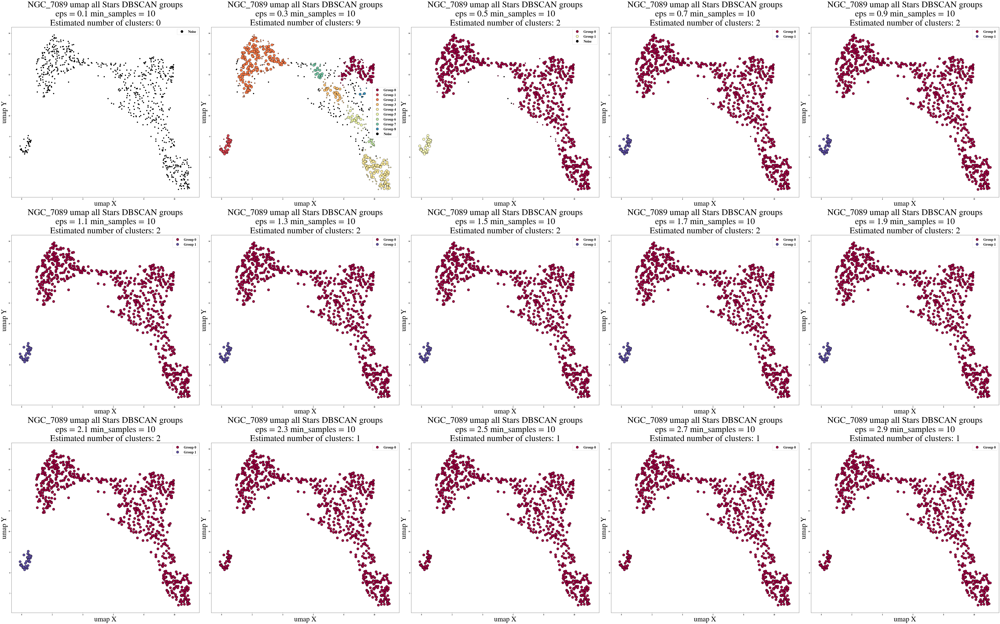

In [73]:
for n in tqdm(range(len(GC_name_arr))):
    try: 
        os.makedirs('GCs_DBSCAN/' + GC_name_arr[n])
    except OSError as error:
        print('Directory ' + GC_name_arr[n] + ' already exists')
    
    plot_ML(GC_name_arr[n], [tsne_control_X[n][0], tsne_control_Y[n][0], tsne_all_X[n], tsne_all_Y[n]], [umap_control_X[n][0], umap_control_Y[n][0], umap_all_X[n], umap_all_Y[n]])
    
    tsne_X_ctrl = np.c_[tsne_control_X[n][0], tsne_control_Y[n][0]]
    tsne_X_all = np.c_[tsne_all_X[n], tsne_all_Y[n]]
    umap_X_ctrl = np.c_[umap_control_X[n][0], umap_control_Y[n][0]]
    umap_X_all = np.c_[umap_all_X[n], umap_all_Y[n]]
    
    db_ctrl_tsne(GC_name_arr[n], tsne_X_ctrl)   
    db_all_tsne(GC_name_arr[n], tsne_X_all)
    db_ctrl_umap(GC_name_arr[n], umap_X_ctrl)
    db_all_umap(GC_name_arr[n], umap_X_all)
    
    print('Done ' + GC_name_arr[n])
    

## setting eps = 3 for tsne and eps = 2 for umap, min_samples = 10 for both, and trying to match the ctrl grouping to all grouping

### for any clusters with more than 2 groups, ignore for now

In [66]:
def plot_ML(name, tsne, umap):
    
    fig = plt.figure(figsize=(10,10))
    plt.plot(tsne[2], tsne[3], 'ok', ms='1') # all
    plt.plot(tsne[0], tsne[1], 'or', ms='5') # ctrl
    plt.title(name + ' tsne', fontsize=30)
    plt.savefig('GCs_DBSCAN_set_eps/' + name + '/tsne.png')
    
    fig = plt.figure(figsize=(10,10))
    plt.plot(umap[2], umap[3], 'ok', ms='1') # all
    plt.plot(umap[0], umap[1], 'or', ms='5') # ctrl
    plt.title(name + ' umap', fontsize=30)
    plt.savefig('GCs_DBSCAN_set_eps/' + name + '/umap.png')

In [106]:
def db_ctrl_tsne_2(name, tsne_X_ctrl):
    plt.close('all')
    #eps_arr_tsne = np.arange(0.1, 3., 0.2)
    
    db_tsne_ctrl = DBSCAN(eps=3, min_samples = 10).fit(tsne_X_ctrl)
    labels_tsne_ctrl_2 = db_tsne_ctrl.labels_
    n_clusters_tsne_ctrl_2 = len(set(db_tsne_ctrl.labels_)) - (1 if -1 in db_tsne_ctrl.labels_ else 0)

    unique_labels_tsne_ctrl_2 = set(labels_tsne_ctrl_2)
    core_samples_masks_tsne_ctrl_2 = np.zeros_like(labels_tsne_ctrl_2, dtype=bool)
    core_samples_masks_tsne_ctrl_2[db_tsne_ctrl.core_sample_indices_] = True

    colors_tsne_ctrl_2 = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_tsne_ctrl_2))]

    fig, ax = plt.subplots(1, figsize=(80,50))

    for k, col in zip(unique_labels_tsne_ctrl_2, colors_tsne_ctrl_2):
        if k == -1:
            # Black used for noise.
            lab = 'Noise'
            col = [0, 0, 0, 1]
        else:
            lab = 'Group ' + str(k)

        class_member_mask = labels_tsne_ctrl_2 == k

        xy = tsne_X_ctrl[class_member_mask & core_samples_masks_tsne_ctrl_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=14,
            label=lab
        )

        xy = tsne_X_ctrl[class_member_mask & ~core_samples_masks_tsne_ctrl_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=6,
        )

    ax.set_xlabel('tsne X', fontsize=40)
    ax.set_ylabel('tsne Y', fontsize=40)
    ax.legend(fontsize=20)
    ax.set_title(name + f'tsne ctrl Stars DBSCAN groups\neps = 2, min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_tsne_ctrl_2}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN_set_eps/' + name + '/db_tsne_ctrl.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_tsne_ctrl_2

In [107]:
def db_all_tsne_2(name, tsne_X_all):
    plt.close('all')
    #eps_arr_tsne = np.arange(0.1, 3., 0.2)
    
    db_tsne_all = DBSCAN(eps=3, min_samples = 10).fit(tsne_X_all)
    labels_tsne_all_2 = db_tsne_all.labels_
    n_clusters_tsne_all_2 = len(set(db_tsne_all.labels_)) - (1 if -1 in db_tsne_all.labels_ else 0)

    unique_labels_tsne_all_2 = set(labels_tsne_all_2)
    core_samples_masks_tsne_all_2 = np.zeros_like(labels_tsne_all_2, dtype=bool)
    core_samples_masks_tsne_all_2[db_tsne_all.core_sample_indices_] = True

    colors_tsne_all_2 = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_tsne_all_2))]

    fig, ax = plt.subplots(1, figsize=(80,50))

    for k, col in zip(unique_labels_tsne_all_2, colors_tsne_all_2):
        if k == -1:
            # Black used for noise.
            lab = 'Noise'
            col = [0, 0, 0, 1]
        else:
            lab = 'Group ' + str(k)

        class_member_mask = labels_tsne_all_2 == k

        xy = tsne_X_all[class_member_mask & core_samples_masks_tsne_all_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=14,
            label=lab
        )

        xy = tsne_X_all[class_member_mask & ~core_samples_masks_tsne_all_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=6,
        )

    ax.set_xlabel('tsne X', fontsize=40)
    ax.set_ylabel('tsne Y', fontsize=40)
    ax.legend(fontsize=20)
    ax.set_title(name + f'tsne all Stars DBSCAN groups\neps = 2, min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_tsne_all_2}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN_set_eps/' + name + '/db_tsne_all.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_tsne_all_2

In [108]:
def db_ctrl_umap_2(name, umap_X_ctrl):
    plt.close('all')
    #eps_arr_umap = np.arange(0.1, 3., 0.2)
    
    db_umap_ctrl = DBSCAN(eps=2, min_samples = 10).fit(umap_X_ctrl)
    labels_umap_ctrl_2 = db_umap_ctrl.labels_
    n_clusters_umap_ctrl_2 = len(set(db_umap_ctrl.labels_)) - (1 if -1 in db_umap_ctrl.labels_ else 0)

    unique_labels_umap_ctrl_2 = set(labels_umap_ctrl_2)
    core_samples_masks_umap_ctrl_2 = np.zeros_like(labels_umap_ctrl_2, dtype=bool)
    core_samples_masks_umap_ctrl_2[db_umap_ctrl.core_sample_indices_] = True

    colors_umap_ctrl_2 = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_umap_ctrl_2))]

    fig, ax = plt.subplots(1, figsize=(80,50))

    for k, col in zip(unique_labels_umap_ctrl_2, colors_umap_ctrl_2):
        if k == -1:
            # Black used for noise.
            lab = 'Noise'
            col = [0, 0, 0, 1]
        else:
            lab = 'Group ' + str(k)

        class_member_mask = labels_umap_ctrl_2 == k

        xy = umap_X_ctrl[class_member_mask & core_samples_masks_umap_ctrl_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=14,
            label=lab
        )

        xy = umap_X_ctrl[class_member_mask & ~core_samples_masks_umap_ctrl_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=6,
        )

    ax.set_xlabel('umap X', fontsize=40)
    ax.set_ylabel('umap Y', fontsize=40)
    ax.legend(fontsize=20)
    ax.set_title(name + f'umap ctrl Stars DBSCAN groups\neps = 2, min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_umap_ctrl_2}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN_set_eps/' + name + '/db_umap_ctrl.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_umap_ctrl_2

In [109]:
def db_all_umap_2(name, umap_X_all):
    plt.close('all')
    #eps_arr_umap = np.arange(0.1, 3., 0.2)
    
    db_umap_all = DBSCAN(eps=2, min_samples = 10).fit(umap_X_all)
    labels_umap_all_2 = db_umap_all.labels_
    n_clusters_umap_all_2 = len(set(db_umap_all.labels_)) - (1 if -1 in db_umap_all.labels_ else 0)

    unique_labels_umap_all_2 = set(labels_umap_all_2)
    core_samples_masks_umap_all_2 = np.zeros_like(labels_umap_all_2, dtype=bool)
    core_samples_masks_umap_all_2[db_umap_all.core_sample_indices_] = True

    colors_umap_all_2 = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_umap_all_2))]

    fig, ax = plt.subplots(1, figsize=(80,50))

    for k, col in zip(unique_labels_umap_all_2, colors_umap_all_2):
        if k == -1:
            # Black used for noise.
            lab = 'Noise'
            col = [0, 0, 0, 1]
        else:
            lab = 'Group ' + str(k)

        class_member_mask = labels_umap_all_2 == k

        xy = umap_X_all[class_member_mask & core_samples_masks_umap_all_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=14,
            label=lab
        )

        xy = umap_X_all[class_member_mask & ~core_samples_masks_umap_all_2]
        ax.plot(
            xy[:, 0],
            xy[:, 1],
            "o",
            markerfacecolor=tuple(col),
            markeredgecolor="k",
            markersize=6,
        )

    ax.set_xlabel('umap X', fontsize=40)
    ax.set_ylabel('umap Y', fontsize=40)
    ax.legend(fontsize=20)
    ax.set_title(name + f'umap all Stars DBSCAN groups\neps = 2, min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_umap_all_2}", fontsize=50)

    plt.tight_layout()
    file_name = 'GCs_DBSCAN_set_eps/' + name + '/db_umap_all.png'
    plt.savefig(file_name)
    #plt.show()
    
    return labels_umap_all_2

Directory NGC_104 already exists
Done NGC_104
Directory NGC_288 already exists
Done NGC_288
Directory NGC_362 already exists
Done NGC_362
Directory NGC_1851 already exists
Done NGC_1851
Directory NGC_1904 already exists
Done NGC_1904
Directory NGC_2298 already exists
Done NGC_2298
Directory NGC_2808 already exists
Done NGC_2808
Directory NGC_3201 already exists
Done NGC_3201
Directory NGC_4590 already exists
Done NGC_4590
Directory NGC_5024 already exists
Done NGC_5024
Directory NGC_5053 already exists
Done NGC_5053
Directory NGC_5272 already exists
Done NGC_5272
Directory NGC_5466 already exists
Done NGC_5466
Directory NGC_5904 already exists
Done NGC_5904
Directory NGC_6121 already exists
Done NGC_6121
Directory NGC_6171 already exists
Done NGC_6171
Directory NGC_6205 already exists
Done NGC_6205
Directory NGC_6218 already exists
Done NGC_6218
Directory NGC_6229 already exists
Done NGC_6229
Directory NGC_6254 already exists
Done NGC_6254
Directory NGC_6273 already exists
Done NGC_627

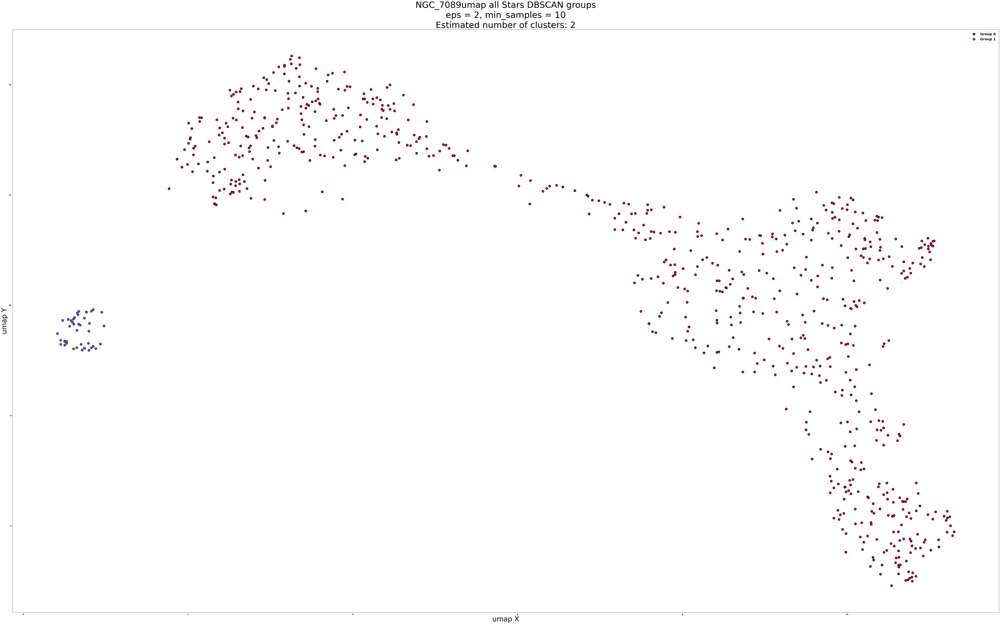

In [110]:
tsne_ctrl_db_labels = []
tsne_all_db_labels = []
umap_ctrl_db_labels = []
umap_all_db_labels = []

for n in tqdm(range(len(GC_name_arr))):
    try: 
        os.makedirs('GCs_DBSCAN_set_eps/' + GC_name_arr[n])
    except OSError as error:
        print('Directory ' + GC_name_arr[n] + ' already exists')
    
    plot_ML(GC_name_arr[n], [tsne_control_X[n][0], tsne_control_Y[n][0], tsne_all_X[n], tsne_all_Y[n]], [umap_control_X[n][0], umap_control_Y[n][0], umap_all_X[n], umap_all_Y[n]])
    
    tsne_X_ctrl = np.c_[tsne_control_X[n][0], tsne_control_Y[n][0]]
    tsne_X_all = np.c_[tsne_all_X[n], tsne_all_Y[n]]
    umap_X_ctrl = np.c_[umap_control_X[n][0], umap_control_Y[n][0]]
    umap_X_all = np.c_[umap_all_X[n], umap_all_Y[n]]
    
    
    
    tsne_ctrl_db_labels.append(db_ctrl_tsne_2(GC_name_arr[n], tsne_X_ctrl))
    tsne_all_db_labels.append(db_all_tsne_2(GC_name_arr[n], tsne_X_all))
    umap_ctrl_db_labels.append(db_ctrl_umap_2(GC_name_arr[n], umap_X_ctrl))
    umap_all_db_labels.append(db_all_umap_2(GC_name_arr[n], umap_X_all))
    
    print('Done ' + GC_name_arr[n])
    

In [118]:
tsne_all_db_labels[11]

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

#### testing for M3

In [146]:
'''tsne_ctrl_grouping = [[] for _ in range(len(GC_name_arr))]
tsne_all_grouping = [[] for _ in range(len(GC_name_arr))]
umap_ctrl_grouping = [[] for _ in range(len(GC_name_arr))]
umap_all_grouping = [[] for _ in range(len(GC_name_arr))]'''

tsne_ctrl_grouping_M3 = []
tsne_all_grouping_M3 = []
umap_ctrl_grouping_M3 = []
umap_all_grouping_M3 = []

#for i in range(len(GC_name_arr)):
for index, label in enumerate(tsne_ctrl_db_labels[11]):
    if label == 0:
        tsne_ctrl_grouping_M3.append(index)

for index, label in enumerate(tsne_all_db_labels[11]):
    if label == 1:
        tsne_all_grouping_M3.append(index)
        
for index, label in enumerate(umap_ctrl_db_labels[11]):
    if label == 1:
        umap_ctrl_grouping_M3.append(index)

for index, label in enumerate(umap_all_db_labels[11]):
    if label == 1:
        umap_all_grouping_M3.append(index)

In [147]:
tsne_same_stars_index = []
tsne_et_stars_index = []

for i in tsne_all_grouping_M3:
    ctrl_X_coord = tsne_control_X[11][0][tsne_ctrl_grouping_M3]
    ctrl_Y_coord = tsne_control_Y[11][0][tsne_ctrl_grouping_M3]
    all_X_coord = tsne_all_X[11][i]
    all_Y_coord = tsne_all_Y[11][i]
    
    if all_X_coord in ctrl_X_coord and all_Y_coord in ctrl_Y_coord:
        tsne_same_stars_index.append(i)
    else:
        tsne_et_stars_index.append(i)

102


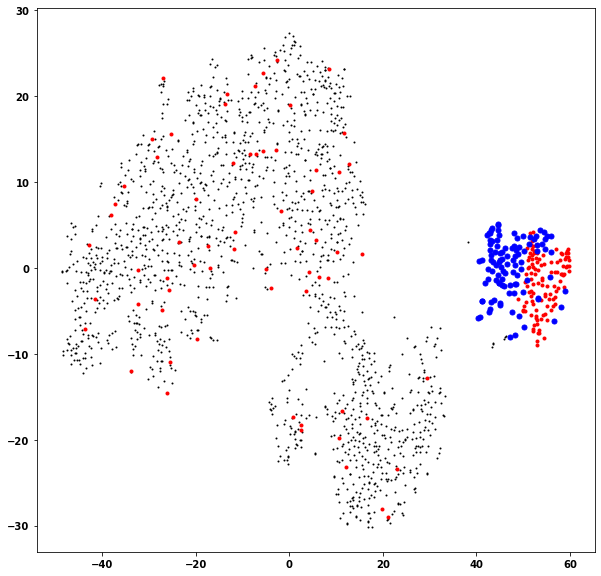

In [153]:
fig = plt.subplots(1, figsize=(10,10))
plt.plot(tsne_all_X[11], tsne_all_Y[11], 'ok', ms=1)
plt.plot(tsne_control_X[11][0], tsne_control_Y[11][0], 'or', ms=3)
plt.plot(tsne_all_X[11][tsne_et_stars_index], tsne_all_Y[11][tsne_et_stars_index], 'ob', ms=5)
#plt.plot(tsne_all_X[11][tsne_same_stars_index], tsne_all_Y[11][tsne_same_stars_index], 'og', ms=5)

print(len(tsne_et_stars_index))

In [150]:
umap_same_stars_index = []
umap_et_stars_index = []

for i in umap_all_grouping_M3:
    ctrl_X_coord = umap_control_X[11][0][umap_ctrl_grouping_M3]
    ctrl_Y_coord = umap_control_Y[11][0][umap_ctrl_grouping_M3]
    all_X_coord = umap_all_X[11][i]
    all_Y_coord = umap_all_Y[11][i]
    
    if all_X_coord in ctrl_X_coord and all_Y_coord in ctrl_Y_coord:
        umap_same_stars_index.append(i)
    else:
        umap_et_stars_index.append(i)

102


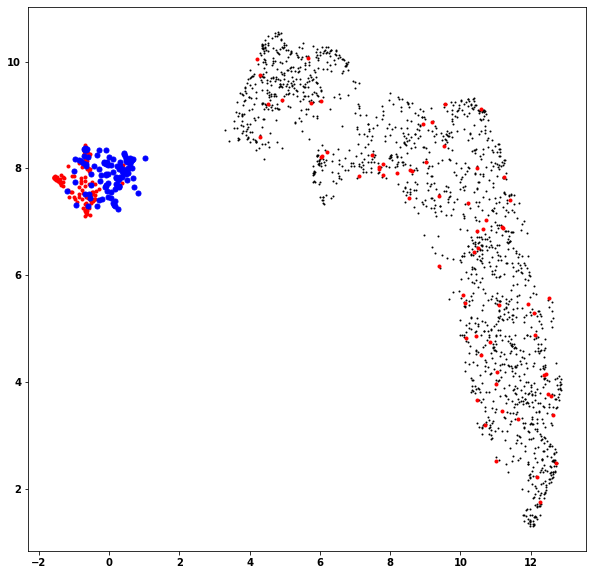

In [151]:
fig = plt.subplots(1, figsize=(10,10))
plt.plot(umap_all_X[11], umap_all_Y[11], 'ok', ms=1)
plt.plot(umap_control_X[11][0], umap_control_Y[11][0], 'or', ms=3)
plt.plot(umap_all_X[11][umap_et_stars_index], umap_all_Y[11][umap_et_stars_index], 'ob', ms=5)

print(len(umap_et_stars_index))

### trying to change min samples to see if that affects anything

### update: not really

Text(0.5, 1.0, 'M3 tsne')

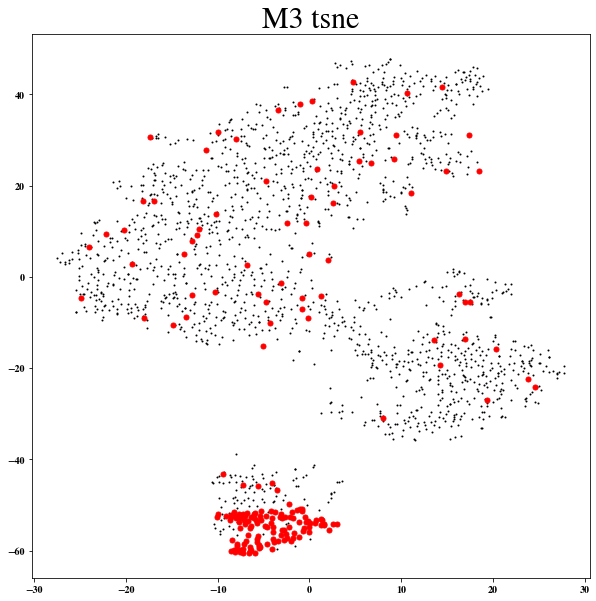

In [74]:
tsne_x_M3_ctrl = tsne_control_X[11][0]
tsne_y_M3_ctrl = tsne_control_Y[11][0]
tsne_x_M3_all = tsne_all_X[11]
tsne_y_M3_all = tsne_all_Y[11]

fig = plt.figure(figsize=(10,10))
plt.plot(tsne_x_M3_all, tsne_y_M3_all, 'ok', ms='1')
plt.plot(tsne_x_M3_ctrl, tsne_y_M3_ctrl, 'or', ms='5')
plt.title('M3 tsne', fontsize=30)

In [ ]:
M3_tsne_X_ctrl = np.c_[tsne_x_M3_ctrl, tsne_y_M3_ctrl]


clustering_tsne_M3_ctrl = DBSCAN(eps=3, min_samples = 10).fit(M3_tsne_X_ctrl)
labels_tsne_M3_ctrl = clustering_tsne_M3_ctrl.labels_

n_clusters_tsne_M3_ctrl = len(set(labels_tsne_M3_ctrl)) - (1 if -1 in labels_tsne_M3_ctrl else 0)

unique_labels_M3_tsne_ctrl_lst = []
core_samples_masks_M3_tsne_ctrl_lst = []
colors_M3_tsne_ctrl_lst = []

for i in range(len(labels_M3_tsne_ctrl_lst)):
    unique_labels_M3_tsne_ctrl_lst.append(set(labels_M3_tsne_ctrl_lst[i]))
    core_samples_masks_M3_tsne_ctrl_lst.append(np.zeros_like(labels_M3_tsne_ctrl_lst[i], dtype=bool))
    core_samples_masks_M3_tsne_ctrl_lst[i][clusterings_M3_tsne_ctrl_lst[i].core_sample_indices_] = True

    colors_M3_tsne_ctrl_lst.append([plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels_M3_tsne_ctrl_lst[i]))])

fig, ax = plt.subplots(3, 5, figsize=(80,50))

for i in range(5):
    for j in range(3):
        for k, col in zip(unique_labels_M3_tsne_ctrl_lst[i + 5*j], colors_M3_tsne_ctrl_lst[i + 5*j]):
            if k == -1:
                # Black used for noise.
                lab = 'Noise'
                col = [0, 0, 0, 1]
            else:
                lab = 'Group ' + str(k)

            class_member_mask = labels_M3_tsne_ctrl_lst[i + 5*j] == k

            xy = M3_tsne_X_ctrl[class_member_mask & core_samples_masks_M3_tsne_ctrl_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=14,
                label=lab
            )

            xy = M3_tsne_X_ctrl[class_member_mask & ~core_samples_masks_M3_tsne_ctrl_lst[i + 5*j]]
            ax[j][i].plot(
                xy[:, 0],
                xy[:, 1],
                "o",
                markerfacecolor=tuple(col),
                markeredgecolor="k",
                markersize=6,
            )
        
        ax[j][i].set_xlabel('tsne X', fontsize=40)
        ax[j][i].set_ylabel('tsne Y', fontsize=40)
        ax[j][i].legend(fontsize=20)
        ax[j][i].set_title(f"M3 tsne ctrl Stars DBSCAN groups\neps = " + str(round(eps_arr_M3_tsne[i + 5*j], 2)) + ' min_samples = 10' + f"\nEstimated number of clusters: {n_clusters_M3_tsne_ctrl_lst[i + 5*j]}", fontsize=50)

plt.tight_layout()
plt.savefig('dbscan_M3_tsne_ctrl.png')
plt.show()

## now run it all again w/o radial velocities

In [156]:
param_list = ['# APOGEE_ID_', 'GAIAEDR3_SOURCE_ID', 'GAIAEDR3_PARALLAX', 'GAIAEDR3_PARALLAX_ERROR',
              'RA', 'DEC', 'GAIAEDR3_PMRA', 'GAIAEDR3_PMRA_ERROR', 'GAIAEDR3_PMDEC', 'GAIAEDR3_PMDEC_ERROR', 
              'VHELIO_AVG', 'VERR', 'SNR',
              'FE_H', 'FE_H_ERR', 'C_FE', 'C_FE_ERR', 'CI_FE', 'CI_FE_ERR', 'N_FE', 'N_FE_ERR',
              'O_FE', 'O_FE_ERR', 'MG_FE', 'MG_FE_ERR', 'AL_FE', 'AL_FE_ERR', 'SI_FE', 'SI_FE_ERR',
              'P_FE', 'P_FE_ERR', 'S_FE', 'S_FE_ERR', 'K_FE', 'K_FE_ERR', 'CA_FE', 'CA_FE_ERR',
              'TI_FE', 'TI_FE_ERR', 'TIII_FE', 'TIII_FE_ERR', 'V_FE', 'V_FE_ERR', 'CR_FE', 'CR_FE_ERR',
              'MN_FE', 'MN_FE_ERR', 'CO_FE', 'CO_FE_ERR', 'NI_FE', 'NI_FE_ERR']

abundance_index = 13 # index where the first chemical abundance starts
RV_index = 10 # where the radial velocity index is (NOTE: USE VHELIO_AVG NOT THE STUPID GAIA ONE)
PMRA_index = 6 # PMRA index
PMDEC_index = 8 # PMDEC index

# dictionary of all relevant parameters we could ever want for tSNE and UMAP
# the abundances should skip every other one due to it being [chem1, chem1_err, chem2, chem2_err, etc.]
all_param_dict_norad = {'FE_H': abundance_index,
                 'C_FE': abundance_index + 2,
                 'CI_FE': abundance_index + 4,
                 'N_FE': abundance_index + 6,
                 'O_FE': abundance_index + 8,
                 'MG_FE': abundance_index + 10,
                 'AL_FE': abundance_index + 12,
                 'SI_FE': abundance_index + 14,
                 'P_FE': abundance_index + 16,
                 'S_FE': abundance_index + 18,
                 'K_FE': abundance_index + 20,
                 'CA_FE': abundance_index + 22,
                 'TI_FE': abundance_index + 24,
                 'TIII_FE': abundance_index + 26,
                 'V_FE': abundance_index + 28,
                 'CR_FE': abundance_index + 30,
                 'MN_FE': abundance_index + 32,
                 'CO_FE': abundance_index + 34,
                 'NI_FE': abundance_index + 36}


fov = 5 # field of view (note: for x by x, use fov = x/2)
ML_index = 0 # 0 for both tSNE and UMAP, 1 for only tSNE, 2 for only UMAP, any other value will raise an error

In [157]:
GC_name_list_norad = GC_db.loc[:, 'Cluster']
GC_stars_dict_norad = {}

GC_ra_list_norad = GC_db.loc[:, 'RA']
GC_dec_list_norad = GC_db.loc[:, 'DEC']

In [158]:
start = time.time()

for count, i in enumerate(GC_name_list):
    GC_stars_dict_norad[i] = master_func_auto(i, all_param_dict_norad, fov, GC_db, apogee_nofilt, param_list, ML_index)
    
end = time.time()

print('that shit took', (end - start) / 60, 'mins')


Processing: NGC_104
467 stars in a 10x10 fov of the GC
Directory NGC_104 already exists

The final amount of stars in our sample is: 467
rhm: 0.08	rt: 1.61
There are 137 stars within half-dist of rhm and rt and 185 stars within the rt
Done!


Processing: NGC_288
293 stars in a 10x10 fov of the GC
Directory NGC_288 already exists

The final amount of stars in our sample is: 287
rhm: 0.05	rt: 0.60
There are 49 stars within half-dist of rhm and rt and 84 stars within the rt


KeyboardInterrupt: 

### Plotting all ML

In [ ]:
point_size_list = []
for i in control_stars_list:
    if i <= 25:
        point_size_list.append(500 + i * 50)
    elif i > 25 and i <= 50:
        point_size_list.append(1500 + i * 50)
    elif i > 50 and i <= 100:
        point_size_list.append(3000 + i * 50)
    elif i > 100:
        point_size_list.append(5000 + i * 50)

In [ ]:
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 50}

plt.rc('font', **font)

plt.figure(figsize=(60,40))
plt.plot(apogee_nofilt.RA, apogee_nofilt.DEC.values, 'ok', markersize=1, alpha=0.5)
plt.scatter(GC_ra_list, GC_dec_list, color='r', s=point_size_list, edgecolor='k', linewidth=3)
plt.xlabel('RA [deg]')
plt.ylabel('DEC [deg]')
plt.title('Plot of the APOGEE dataset stars and GC cluster central location based on control group size')
plt.savefig('GC_map.png')

#### Warning: Only run this block below if you have a beefy computer or if you wanna experience MS slideshow

In [ ]:
font = {'family' : 'DejaVu Sans',
        'weight' : 'bold',
        'size'   : 10}

plt.rc('font', **font)

fig, ax = plt.subplots(23, 14, figsize=(230, 200))
for i in range(23):
    for j in range(7):
        # tSNE
        ax[i, 2 * j].scatter(GC_stars_dict[GC_name_list[i + j * 14]][0], GC_stars_dict[GC_name_list[i + j * 14]][1], s=1, c='gray') # all
        ax[i, 2 * j].scatter(GC_stars_dict[GC_name_list[i + j * 14]][2], GC_stars_dict[GC_name_list[i + j * 14]][3], s=45, edgecolor='k', c='hotpink') # control
        ax[i, 2 * j].set_title(GC_name_list[i + j * 14] + ' tSNE')
        ax[i, 2 * j].set_xlabel('tSNE X')
        ax[i, 2 * j].set_ylabel('tSNE Y')
        # UMAP
        ax[i, 2 * j + 1].scatter(GC_stars_dict[GC_name_list[i + j * 14]][4], GC_stars_dict[GC_name_list[i + j * 14]][5], s=1, c='gray') # all
        ax[i, 2 * j + 1].scatter(GC_stars_dict[GC_name_list[i + j * 14]][6], GC_stars_dict[GC_name_list[i + j * 14]][7], s=45, edgecolor='k', c='hotpink') # control
        ax[i, 2 * j + 1].set_title(GC_name_list[i + j * 14] + ' UMAP')
        ax[i, 2 * j + 1].set_xlabel('UMAP X')
        ax[i, 2 * j + 1].set_ylabel('UMAP Y')
        
        
plt.tight_layout()
plt.savefig('all_ML.png')
plt.show()

In [ ]:
plt.hist(total_stars_list, bins=20, color='k')
plt.hist(control_stars_list, bins=5, color='r', alpha=0.5)
plt.show()

In [ ]:
fig = plt.figure(figsize=(12,8))
plt.plot(GC_name_list, total_stars_list, 'ok', markersize=1)
plt.plot(GC_name_list, control_stars_list, 'or', markersize=1)
plt.show()